# Import

In [53]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib
from tqdm import tqdm_notebook
from glob import glob
import os
import pandas as pd
import numpy as np
import math
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
from sklearn.preprocessing import scale
import cv2

from functions.utils import *
from functions.plotting import *

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [60]:
# Python 3.8
# packages versions

print('\n'.join(f'{m.__name__}=={m.__version__}' for m in globals().values() \
                if getattr(m, '__version__', None)))

matplotlib==3.5.1
pandas==1.1.4
numpy==1.20.3
seaborn==0.11.2
cv2==4.5.5


In [2]:
plt.rcParams['figure.facecolor'] = (1,1,1,1)
plt.rcParams['figure.dpi'] = 200

In [3]:
sns.set_style('white')

## Other data

In [4]:
cells_o = ['NK_cells', 'CD4_T_cells',
           'CD8_T_cells', 'B_cells',
           'Monocytes', 'Macrophages',
           'Neutrophils', 'Fibroblasts',
           'Endothelium', 'Other']

In [5]:
default_cmap = matplotlib.cm.coolwarm

In [6]:
multireg_samples_order = pd.Index(['117-A1', '117-A2', '117-A3', 
                                   '120-A1', '120-A2', '120-A3', 
                                   '124-A1', '124-A2'])

In [7]:
ann = read_dataset('./data/annotation.tsv')
print(ann.shape)

ann['Sample'] = ann.Sample.apply(str)

ann.index = [x[-6:] for x in ann.index]

(10, 13)


## Palletes

<AxesSubplot:>

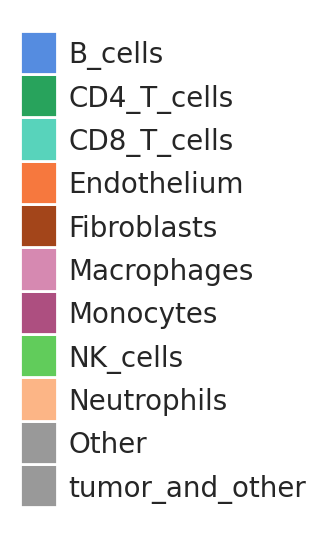

In [8]:
cells_p = { 'B_cells': '#558ce0',
            'CD4_T_cells': '#28a35c',
            'CD8_T_cells': '#58d3bb',
            'Endothelium': '#F6783E',
            'Fibroblasts': '#a3451a',
            'Macrophages': '#d689b1',
            'Monocytes': '#ad4f80',
            'NK_cells': '#61cc5b',
            'Neutrophils': '#FCB586',
            'Other': '#999999',
            'tumor_and_other': '#999999',
}

patch_plot(cells_p)

<AxesSubplot:>

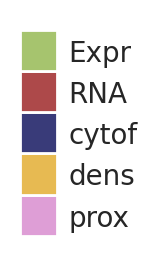

In [9]:
cluster_ann_pal = {'RNA': '#ad494a', 'cytof': '#393b79', 'dens': '#e7ba52', 'prox': '#de9ed6',
                  'Expr': '#a6c46e'}

patch_plot(cluster_ann_pal)

<AxesSubplot:>

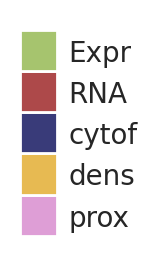

In [10]:
cells_p_all = {
  'Tumor': '#383838',
 'Unidentified': '#999999',
    'B_cells': '#558ce0',
 'CD4_T_cells': '#28a35c',
 'CD8_T_cells': '#58d3bb',
    'T_cells': '#407a3c',
 'Endothelium': '#F6783E',    
 'Fibroblasts': '#a3451a',
 'Macrophages': '#d689b1',
    'Monocytes': '#ad4f80',
 'NK_cells': '#61cc5b',
 'Neutrophils': '#FCB586',
 'normal_kidney': '#c7c7c7',
 'tumor_and_other': '#999999'
}
patch_plot(cluster_ann_pal)

In [11]:
cell_p_mxif2 = {
'tumor': '#383838',
'macro': '#d321ed',
't_cells': '#02c905',
'undefined': '#d1cdcd',
'endothelial_cells': '#d61e11',
'b_cells': '#1b1bc0'
}

In [12]:
cell_p_mxif_tmp = {
 'tumor': '#383838',
 'macro': '#d321ed',
 'undefined': '#d1cdcd',
 'b_cells': '#1b1bc0',
 'CD4': '#079127',
 'CD8': '#11a7b8',
    'endothelial_cells': '#d61e11',
}

In [13]:
cell_p_mxif3 = {'tumor': '#383838',
 'macro': '#d321ed',
 'undefined': '#d1cdcd',
 'b_cells': '#1b1bc0',
 'CD4': '#079127',
 'CD8': '#11a7b8',}

In [14]:
t_cells_p = {'CD4': '#079127',
 'CD8': '#11a7b8',
 'CD4_KI67+': '#c79e18',
 'CD8_KI67+': '#027870',
 'CD8_GRB+': '#bd3796'}

In [15]:
cells_p_snRNA = {'B_cells': '#558ce0',
 'Endothelium': '#F6783E',
 'Fibroblasts': '#a3451a',
 'Macrophages': '#d689b1',
 'T_cells': '#41a115',
                 
 'CD4_T_cells': '#28a35c',
 'CD8_T_cells': '#58d3bb',
 'normal_kidney': '#c7c7c7',
 'Tumor': '#999999'}

In [16]:
prox_comm_raw_pallette = {'cluster_0': '#E6A900', 
'cluster_1': '#00BE50',
'cluster_10': '#1b1bc0',
'cluster_11': '#E28FE2',
'cluster_12': '#BE006B',
'cluster_13': '#DC27DB',
'cluster_14': '#acfcae',
'cluster_2': '#57DFC0',
'cluster_3': '#A7B800',
'cluster_4': '#A8958B',
'cluster_5': '#A2A2AE',
'cluster_6': '#00695A',
'cluster_8': '#FF3C3C',
'cluster_9': '#cff081'}


mxif_map = {'cluster_9': '1. S: [Mf, Blood vessels in Tumor]',
'cluster_11': '2. S: [Mf, Immune cells in Tumor]',
'cluster_4': '3. S: [Blood vessels, Mf, lowest proportion of T cells in Tumor]',
'cluster_0': '4. S: [Tumor cells enriched]', 
'cluster_3': '5. S: [CD4, CD8 T cells in Tumor]',
'cluster_1': '6. S: [T cells enriched, B cells in Stroma]',
'cluster_14': '7. S: [CD8 T cells enriched]',
'cluster_5': '8. S: [Immune cells enriched in Stroma]',
'cluster_6': '9. S: [T cells enriched in Tumor Margin]',
'cluster_12': '10. S: [T cells, Mf]',
'cluster_2': '11. S: [CD4 T cells enriched]',
'cluster_13': '12. S: [Mf enriched]',
'cluster_10': '13. S: [B cells enriched]',
'cluster_8': '14. S: [Blood vessels]'}

prox_comm_pallette = {'prox: '+mxif_map[x]:prox_comm_raw_pallette[x] for x in mxif_map.keys()}


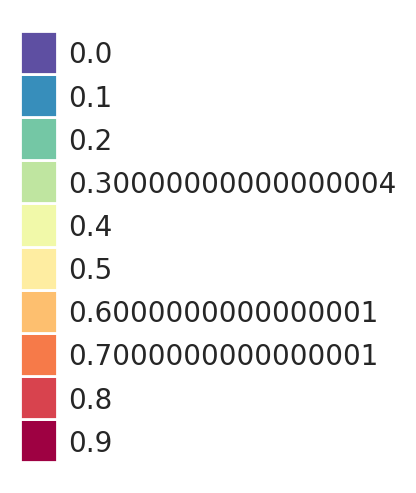

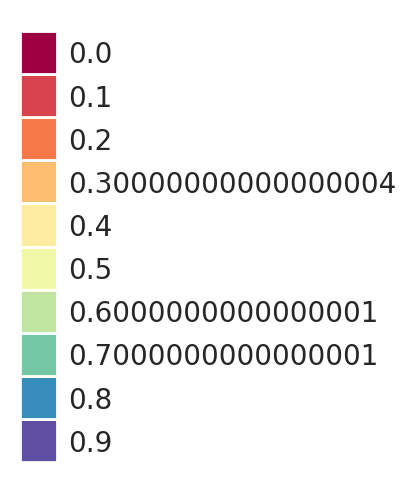

In [17]:
cytof_marker_intensity_pal_r = \
    lin_colors(pd.Series(np.arange(0, 1, .1)), cmap=matplotlib.cm.Spectral_r)
ax = patch_plot(cytof_marker_intensity_pal_r)
ax.tick_params(length=0)

cytof_marker_intensity_pal = \
    lin_colors(pd.Series(np.arange(0, 1, .1)), cmap=matplotlib.cm.Spectral)
ax = patch_plot(cytof_marker_intensity_pal)
ax.tick_params(length=0)

In [18]:
cvals  = [-2, -.8, 0, .8, 2]
colors = [cytof_marker_intensity_pal_r[0], 
          cytof_marker_intensity_pal_r[0.1], 
          '#faecb6',  
          cytof_marker_intensity_pal_r[0.8], 
          cytof_marker_intensity_pal_r[.9]]

norm = plt.Normalize(min(cvals), max(cvals))
tuples = list(zip(map(norm, cvals), colors))
cmap_tmp = matplotlib.colors.LinearSegmentedColormap.from_list("", tuples)

In [19]:
cells_p_cytof = {
  'Tumor': '#383838',
 'Unidentified': '#999999',
    'B_cells': '#558ce0',
 'CD4_T_cells': '#28a35c',
 'CD8_T_cells': '#58d3bb',
 'Endothelium': '#F6783E',
 'Macrophages': '#d689b1',
 'NK_cells': '#61cc5b',
 'Neutrophils': '#FCB586',}


In [20]:
cytof_subpop_pal_all_hierarchy = {'Tumor': '#383838',
 'Unidentified': '#999999',
 'B_cells': '#558ce0',
 'CD4_T_cells': '#28a35c',
 'CD8_T_cells': '#58d3bb',
 'Endothelium': '#F6783E',
 'Macrophages': '#d689b1',
 'NK_cells': '#61cc5b',
 'Neutrophils': '#FCB586',
 'Macro_1_1': '#e377c2',
 'Macro_2_1': '#9467bd',
 'Macro_3_1': '#9467bd',
 'Macro_2_2': '#16a1a8',
 'Macro_3_2': '#32876e',
 'Macro_3_3': '#8de0c7',
 'Macro_2_3': '#c74e76',
 'Macro_3_4': '#c21506',
 'Macro_3_5': '#fa9c93',
 'Macro_3_6': '#a31277',
 'Macro_3_7': '#f74fc4',
 'Macro_1_2': '#e7ba52',
 'Macro_2_4': '#10b30b',
 'Macro_3_8': '#10b30b',
 'Macro_2_5': '#995c00',
 'Macro_3_9': '#995c00',
 'Macro_2_6': '#E6AB02',
 'Macro_3_10': '#E6AB02',
 'CD4_1_1': '#5098bf',
 'CD4_2_1': '#1f77b4',
 'CD4_3_1': '#11588a',
 'CD4_3_2': '#4795cc',
 'CD4_3_3': '#bf5e08',
 'CD4_2_2': '#2ca02c',
 'CD4_3_4': '#49c449',
 'CD4_3_5': '#197d19',
 'CD4_2_3': '#f09b4f',
 'CD4_3_6': '#f09b4f',
 'CD4_1_2': '#e35040',
 'CD4_2_4': '#d62728',
 'CD4_3_7': '#ad1c1d',
 'CD4_3_8': '#e06364',
 'CD4_2_5': '#9467bd',
 'CD4_3_9': '#af8ad1',
 'CD4_3_10': '#63378c',
 'CD4_2_6': '#6b3d33',
 'CD4_3_11': '#6b3d33',
 'CD4_2_7': '#a6776d',
 'CD4_3_12': '#a6776d',
 'CD4_2_8': '#cc3da0',
 'CD4_3_13': '#e377c2',
 'CD4_3_14': '#a83284',
 'CD8_1_1': '#756e6e',
 'CD8_2_1': '#948893',
 'CD8_3_1': '#756e6e',
 'CD8_3_2': '#F781BF',
 'CD8_3_3': '#b82e74',
 'CD8_1_2': '#5eabe0',
 'CD8_2_2': '#823e16',
 'CD8_3_4': '#752f06',
 'CD8_3_5': '#b5744e',
 'CD8_2_3': '#d13030',
 'CD8_3_6': '#e06e6f',
 'CD8_3_7': '#cc0003',
 'CD8_3_8': '#d96d02',
 'CD8_3_9': '#edbc51',
 'CD8_2_4': '#6dc8d6',
 'CD8_3_10': '#6dc8d6',
 'CD8_2_5': '#1f68a3',
 'CD8_3_11': '#377EB8',
 'CD8_3_12': '#800a91',
 'CD8_3_13': '#b884bf'}

<AxesSubplot:>

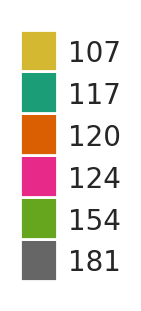

In [21]:
samples_pal = {'117': '#1b9e77',
 '120': '#d95f02',
 '124': '#e7298a',
 '154': '#66a61e',
 '107': '#d4b831',
 '181': '#666666'}


patch_plot(samples_pal)

# CyTOF

## Load data

In [22]:
cytof_data_all = read_dataset('./data/cytof/all_samples_with_cell_subtypes.csv.gz', sep=',')
cytof_data_all.shape

(7434358, 6)

In [23]:
map_cytof_columns = {}

map_cytof_columns.update({'Sample': 'str', 'Cell_type': 'str', 'Patient': 'int', 
    'Cell_subtype': 'str', 'Cell_subtype_first_level': 'str', 'Cell_subtype_second_level': 'str'})

In [24]:
cytof_data_all = cytof_data_all.astype(map_cytof_columns)

In [25]:
pivot_cells_raw = pivot_vectors(
    cytof_data_all[cytof_data_all.Cell_type.isin(cells_o+['Tumor'])].Cell_subtype, cytof_data_all.Sample)

pivot_cells_big_subpop_raw = pivot_vectors(
    cytof_data_all[cytof_data_all.Cell_type.isin(cells_o+['Tumor'])].Cell_type, cytof_data_all.Sample)

pivot_cells_first_level_raw = pivot_vectors(
    cytof_data_all[cytof_data_all.Cell_type.isin(cells_o+['Tumor'])].Cell_subtype_first_level, cytof_data_all.Sample)

pivot_cells_second_level_raw = pivot_vectors(
    cytof_data_all[cytof_data_all.Cell_type.isin(cells_o+['Tumor'])].Cell_subtype_second_level, cytof_data_all.Sample)

In [26]:
cytof_subpop_hierarchy = read_dataset('./data/cytof/cytof_subpop_hierarchy.tsv')

In [27]:
t_cd4_order = {}

for col in ['First_level', 'Second_level', 'Third_level']:
    
    t_cd4_order[col] = list()
    
    t_cd4_order[col] = list(cytof_subpop_hierarchy[cytof_subpop_hierarchy['Cell_type'] == 'CD4'][
        col].drop_duplicates().values)
    
t_cd8_order = {}

for col in ['First_level', 'Second_level', 'Third_level']:
    
    t_cd8_order[col] = list()
    
    t_cd8_order[col] = list(cytof_subpop_hierarchy[cytof_subpop_hierarchy['Cell_type'] == 'CD8'][
        col].drop_duplicates().values)

macro_order = {}

for col in ['First_level', 'Second_level', 'Third_level']:
    
    macro_order[col] = list()
    
    macro_order[col] = list(cytof_subpop_hierarchy[cytof_subpop_hierarchy['Cell_type'] == 'Macro'][
        col].drop_duplicates().values)

In [28]:
pivot_cells = pd.concat([pivot_cells_raw[macro_order['Third_level']].T.div(
    pivot_cells_raw[macro_order['Third_level']].sum(axis=1)),
                         pivot_cells_raw[t_cd4_order['Third_level']].T.div(
    pivot_cells_raw[t_cd4_order['Third_level']].sum(axis=1)),
                         pivot_cells_raw[t_cd8_order['Third_level']].T.div(
    pivot_cells_raw[t_cd8_order['Third_level']].sum(axis=1))])
pivot_cells.shape

(37, 21)

In [29]:
pivot_cells_second_level = pd.concat([pivot_cells_second_level_raw[macro_order['Second_level']].T.div(
    pivot_cells_second_level_raw[macro_order['Second_level']].sum(axis=1)),
                         pivot_cells_second_level_raw[t_cd4_order['Second_level']].T.div(
    pivot_cells_second_level_raw[t_cd4_order['Second_level']].sum(axis=1)),
                         pivot_cells_second_level_raw[t_cd8_order['Second_level']].T.div(
    pivot_cells_second_level_raw[t_cd8_order['Second_level']].sum(axis=1))])

pivot_cells_second_level.shape

(19, 21)

## CyTOF TSNE

In [30]:
tsne_coord = read_dataset('./data/cytof/TSNE_all_batch_corrected_20k_perplex200.tsv.gz')

tsne_coord['Sample'] = [x.split('_')[0][3:]+'-'+x.split('_')[1] for x in tsne_coord.index]
tsne_coord['Sample'] = tsne_coord.Sample.replace('-A4', '107-A4').replace('-A3', '107-A3').replace(
    '-A2', '107-A2').replace('-A1', '107-A1')

tsne_coord['Patient'] = tsne_coord['Sample'].apply(lambda x: x.split('-')[0])

tsne_coord['Cell'] = cytof_data_all.loc[tsne_coord.index].Cell_type

In [31]:
tsne_coord = tsne_coord[tsne_coord.Cell.isin(['Tumor']+cells_o)]
tsne_coord.shape

(420000, 5)

In [32]:
selected_index_full_names = tsne_coord.Cell[tsne_coord.Cell.isin(['Tumor']+cells_o)].index
len(selected_index_full_names)

420000

In [33]:
tsne_coord['Cell_subtype'] = cytof_data_all.Cell_subtype[tsne_coord.index]
tsne_coord['Cell_subtype_first_level'] = cytof_data_all.Cell_subtype_first_level[tsne_coord.index]
tsne_coord['Cell_subtype_second_level'] = cytof_data_all.Cell_subtype_second_level[tsne_coord.index]

20000
20000
20000
20000
20000
20000
20000
20000
20000
20000
20000
0
20000
20000
20000
0
20000
20000
20000
20000
20000
20000
20000
0


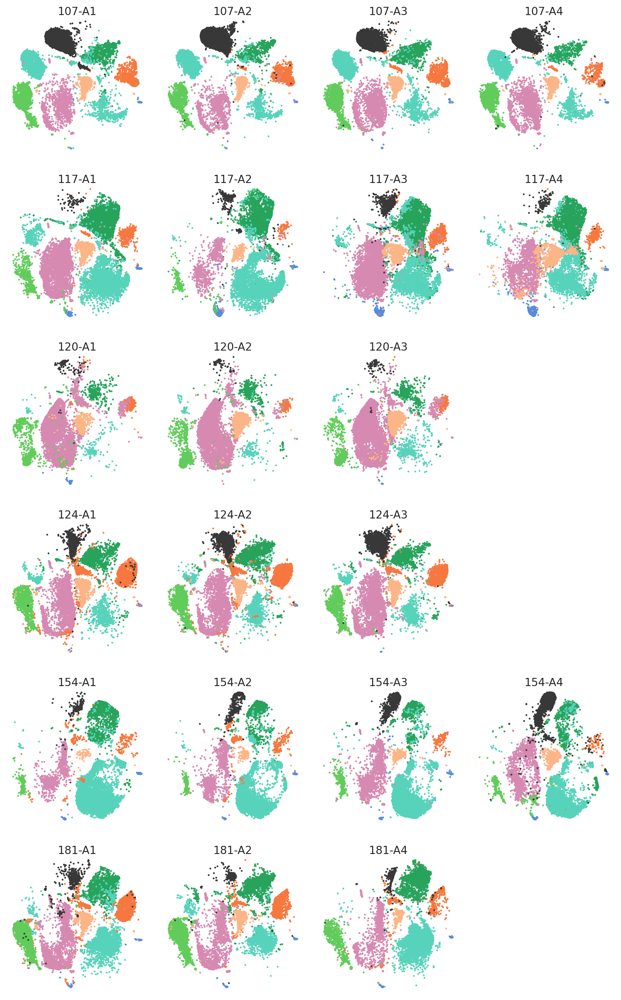

In [34]:
sns.set_style('white')

df = tsne_coord

af = axis_net(4, 6, x_len=3, y_len=3.3)

for pat in [
    
     '107-A1', '107-A2', '107-A3', '107-A4',
     '117-A1', '117-A2', '117-A3', '117-A4',
     '120-A1', '120-A2', '120-A3', None,
     '124-A1', '124-A2', '124-A3', None,
     '154-A1', '154-A2', '154-A3', '154-A4',
     '181-A1', '181-A2', '181-A4', None,]:

    ind = df[df.Sample == pat].index
    print(len(ind))
    ax = next(af)
    
    if pat is None:
        ax.set_visible(False)
        continue

    ax = simple_palette_scatter(
        df.loc[ind].x.rename(''), 
        df.loc[ind].y.rename(''), 
        df.loc[ind].Cell, 
        palette=cells_p_cytof, s=4, ax=ax, legend=False, linewidth=0)
    
    ax.set_title(pat, size=12, pad=0)
    ax.set_xticklabels('')
    ax.set_yticklabels('')
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.grid(False)


plt.subplots_adjust(hspace=.2, wspace=.1) 

## Other PCA, botbarplots, heatmaps

In [35]:
samples_ann_tmp = pd.Series(index=pivot_cells.columns, data=[x.split('-')[0] for x in pivot_cells.columns])

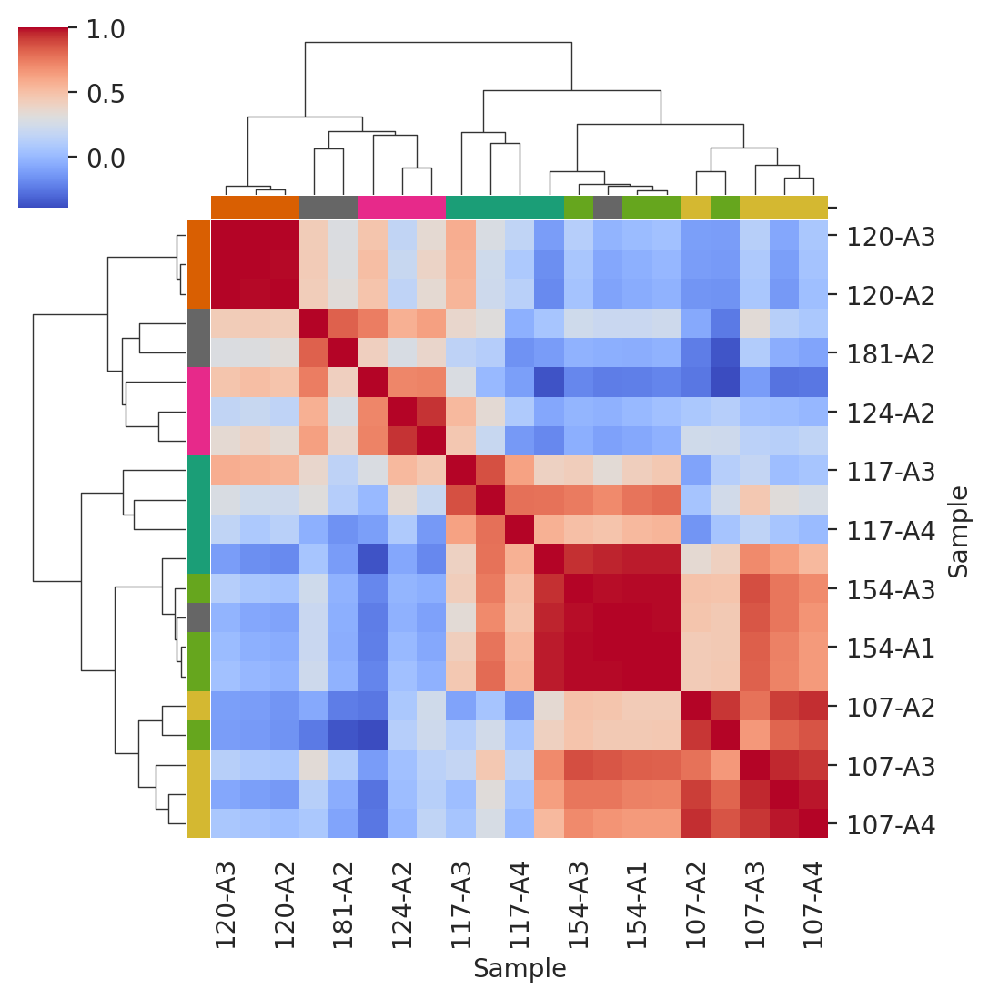

In [36]:
sns.clustermap(
    pivot_cells_big_subpop_raw.T.div(pivot_cells_big_subpop_raw.sum(axis=1), axis=1).corr(),
    cmap=default_cmap, figsize=(5.5, 5.5), col_colors=samples_ann_tmp.map(samples_pal),
    row_colors=samples_ann_tmp.map(samples_pal))

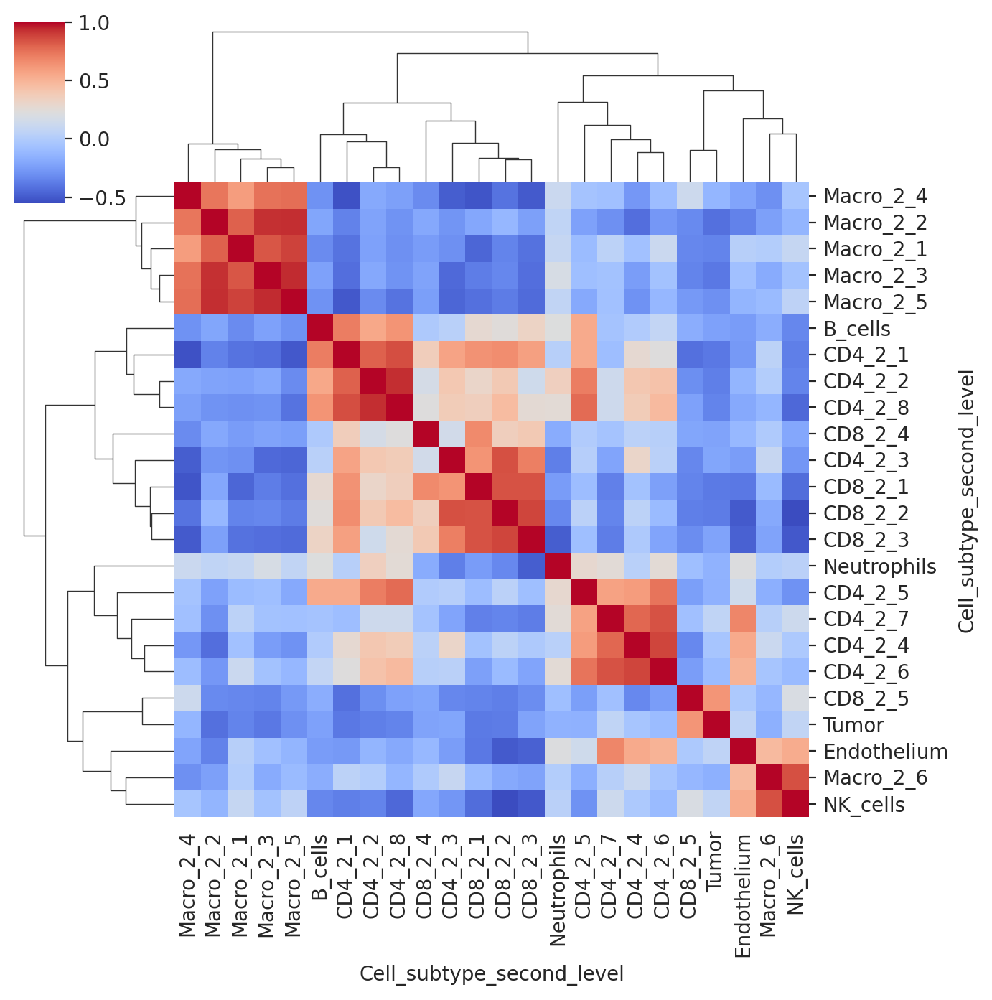

In [37]:
sns.clustermap(
    pivot_cells_second_level_raw.T.div(pivot_cells_second_level_raw.sum(axis=1), axis=1).T.corr(),
    cmap=default_cmap, figsize=(7, 7), )

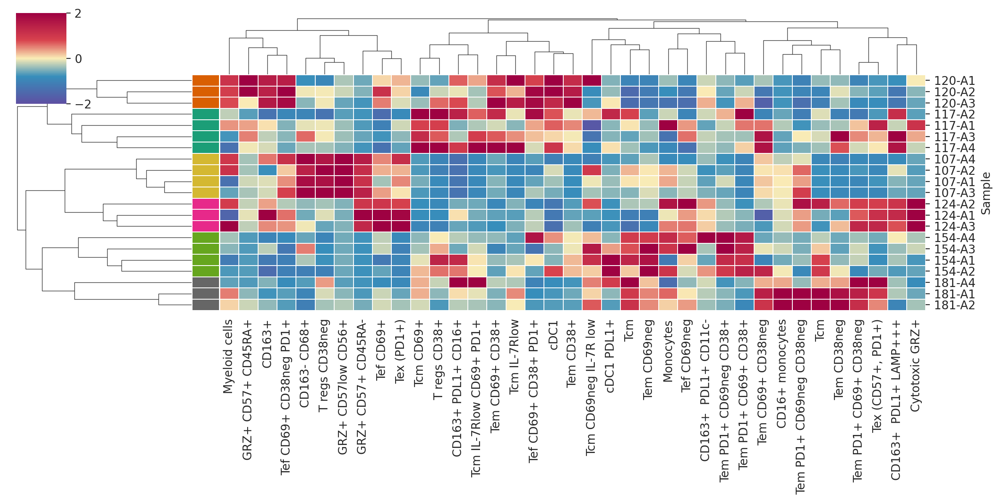

In [38]:
pivot_cells_new_index = pivot_cells.copy()

pivot_cells_new_index.index = [
    cytof_subpop_hierarchy.set_index('Third_level')['Third_level_label'].to_dict()[x] for x in \
    pivot_cells_new_index.index]

cvals  = [-2, -.8, 0, .8, 2]
colors = [cytof_marker_intensity_pal_r[0], 
          cytof_marker_intensity_pal_r[0.1], 
          '#faecb6',  
          cytof_marker_intensity_pal_r[0.8], 
          cytof_marker_intensity_pal_r[.9]]

norm = plt.Normalize(min(cvals), max(cvals))
tuples = list(zip(map(norm, cvals), colors))
cmap_tmp = matplotlib.colors.LinearSegmentedColormap.from_list("", tuples)

g = sns.clustermap(pivot_cells_new_index.T.apply(scale), cmap=cmap_tmp, vmin=-2, vmax=2, figsize=(12, 6),
              row_colors=samples_ann_tmp.map(samples_pal), method='complete',
            linewidths=.003, linecolor='white')


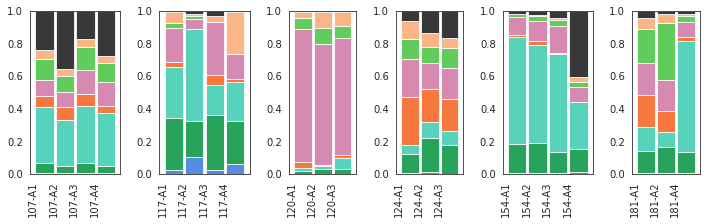

In [50]:
af = axis_net(6, 1, gridspec_kw={'width_ratios': [4, 4, 3, 3, 4, 3]}, x_len=2, y_len=3)

for pats in [['107-A1', '107-A2', '107-A3', '107-A4'], ['117-A1', '117-A2', '117-A3','117-A4'], 
             ['120-A1', '120-A2', '120-A3'], ['124-A1', '124-A2', '124-A3'],
             ['154-A1', '154-A2', '154-A3', '154-A4'], ['181-A1', '181-A2', '181-A4']]:
        
    ax = bot_bar_plot(pivot_cells_big_subpop_raw.T.div(pivot_cells_big_subpop_raw.T.sum())[pats].T, 
              palette=cells_p_cytof, lrot=90, ax=next(af), legend=False, linewidth=.8, pvalue=True)
    ax.set_xlabel('')
    ax.set_ylim(0, 1)

plt.subplots_adjust(wspace=.5)

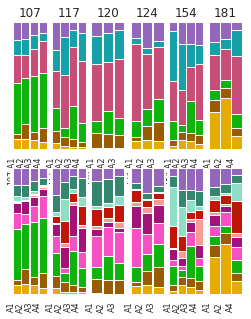

In [51]:
for cell, cell_order in zip(['Macrophages', 'CD4_T_cells', 'CD8_T_cells'],
           [macro_order, t_cd4_order, t_cd8_order]):

    with sns.axes_style('white'):
        af = axis_net(len(sorted(set(cytof_data_all.Patient))), 2, x_len=.7, y_len=2.5)

    data_all_tmp = cytof_data_all[(cytof_data_all.Cell_type == cell)]
    data_all_tmp['Patient'] = data_all_tmp.Sample.apply(lambda x: x.split('-')[0])

    for level, cell_level in zip(['Cell_subtype_second_level', 'Cell_subtype', ],
                                 ['Second_level', 'Third_level', ]):

        for pat in sorted(set(data_all_tmp.Patient)):

            so_tmp = sorted(set(data_all_tmp[data_all_tmp.Patient == pat].Sample))

            ax = bot_bar_plot(pivot_vectors(data_all_tmp[level], data_all_tmp.Sample).loc[
                so_tmp, cell_order[cell_level][::-1]], 
                bar_width=.95, linewidth=1, xl=False, edgecolor='white', 
                palette=cytof_subpop_pal_all_hierarchy, legend=False, ax=next(af), percent=True)

            ax.tick_params(axis='both', which='major', labelsize=8)
            ax.set_xlabel('')
            
            ax.set_yticklabels('')
            
            
            if cell_level == 'Second_level':
                ax.set_title(pat)
                
            if cell_level != 'Second_level':
                ax.set_xticklabels([x[-2:] for x in so_tmp])

            ax.spines['top'].set_visible(False)
            ax.spines['bottom'].set_visible(False)
            ax.spines['left'].set_visible(False)
            ax.spines['right'].set_visible(False)

    plt.subplots_adjust(wspace=.015, hspace=.15)
    

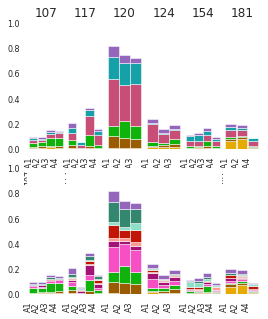

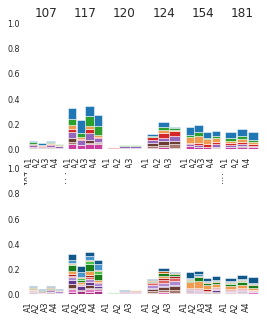

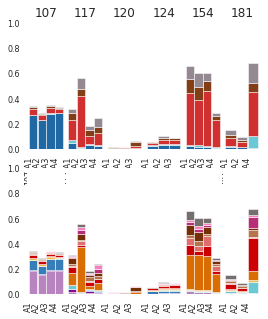

In [62]:
for cell, cell_order in zip(['Macrophages', 'CD4_T_cells', 'CD8_T_cells'],
           [macro_order, t_cd4_order, t_cd8_order]):

    with sns.axes_style('white'):
        af = axis_net(len(sorted(set(cytof_data_all.Patient))), 2, x_len=.7, y_len=2.5)

    data_all_tmp = cytof_data_all[(cytof_data_all.Cell_type == cell)]
    data_all_tmp['Patient'] = data_all_tmp.Sample.apply(lambda x: x.split('-')[0])

    for level, cell_level in zip(['Cell_subtype_second_level', 'Cell_subtype', ],
                                 ['Second_level', 'Third_level', ]):

        for pat in sorted(set(data_all_tmp.Patient)):

            so_tmp = sorted(set(data_all_tmp[data_all_tmp.Patient == pat].Sample))

            ax = bot_bar_plot(pivot_vectors(data_all_tmp[level], data_all_tmp.Sample).loc[
                    so_tmp, cell_order[cell_level][::-1]].div(
                    cytof_data_all.Sample.value_counts()[so_tmp], axis=0), 
                bar_width=.95, linewidth=0.5, xl=False, edgecolor='white', 
                palette=cytof_subpop_pal_all_hierarchy, legend=False, ax=next(af), percent=False)

            ax.tick_params(axis='both', which='major', labelsize=8)
            ax.set_xlabel('')
            
            ax.set_ylim(0, 1)
            
            if pat != '107':
                ax.set_yticklabels('')
            
            
            if cell_level == 'Second_level':
                ax.set_title(pat)
                
            if cell_level != 'Second_level':
                ax.set_xticklabels([x[-2:] for x in so_tmp])

            ax.spines['top'].set_visible(False)
            ax.spines['bottom'].set_visible(False)
            ax.spines['left'].set_visible(False)
            ax.spines['right'].set_visible(False)

    plt.subplots_adjust(wspace=.015, hspace=.15)
        
    plt.show()

In [63]:
cytof_subpop_diff = []

for pat in sorted(set(cytof_data_all.Patient)):
    
    ind = set(cytof_data_all[cytof_data_all.Patient == pat].Sample)
    
    cytof_subpop_diff.append((pivot_cells[ind].max(axis=1) - pivot_cells[ind].min(axis=1)).rename(pat))

In [64]:
cytof_subpop_diff = pd.concat(cytof_subpop_diff, axis=1)
cytof_subpop_diff.shape

(37, 6)

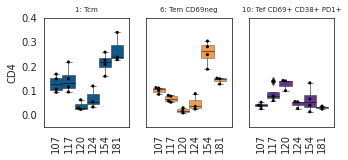

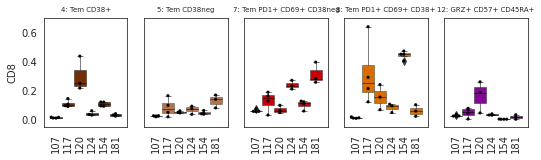

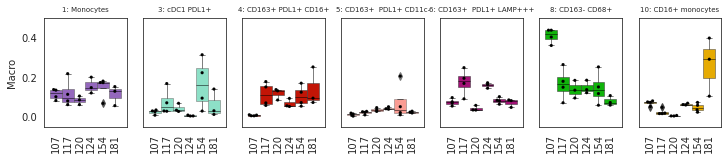

In [65]:
subt = [['CD4_3_1', 'CD4_3_6', 'CD4_3_10'],
       ['CD8_3_4', 'CD8_3_5', 'CD8_3_7', 'CD8_3_8', 'CD8_3_12'],
       ['Macro_3_1', 'Macro_3_3', 'Macro_3_4', 'Macro_3_5', 'Macro_3_6', 'Macro_3_8', 'Macro_3_10']]

for order, ylim in zip(subt, [(-.05, .4), (-.05, .7), (-.05, .5)]):
    
    af = axis_net(len(order), 1, x_len=2*1.3/1.5, y_len=1.5*2/1.5)

    for i in order:

        tmp = pivot_cells.loc[[i]].T

        tmp['Sample'] = tmp.index
        tmp['Sample'] = tmp['Sample'].apply(lambda x: x[:-3])

        ax = next(af)
        ax = sns.boxplot(y=i, x='Sample', data=tmp, saturation=1,
                         color=cytof_subpop_pal_all_hierarchy[i],  
                         ax=ax, width=1, linewidth=.5)
        ax = sns.swarmplot(y=i, x='Sample', color='black', data=tmp, ax=ax, size=3, linewidth=.1)
        
        plt.setp(ax.artists, edgecolor = 'k')
        plt.setp(ax.lines, color='k')
        
        ax.grid(False)
        ax.set_ylabel('')
        ax.set_xlabel('')
        ax.set_xticklabels(sorted(set(tmp.Sample)), rotation=90)
        ax.set_title(i.split('_')[2]+': '+
            cytof_subpop_hierarchy[cytof_subpop_hierarchy.Third_level == i].Third_level_label.values[0],
            size=7)
        ax.set_ylim(ylim)
        ax.set_xlim(-1, 6)
        
        if i == order[0]:
            ax.set_ylabel(i.split('_')[0])

        if i != order[0]:
            ax.set_yticklabels('')

    plt.subplots_adjust(wspace=.2)

# Expressions

In [66]:
multir_expr_raw = read_dataset('./data/expression_raw.tsv')

In [67]:
multireg_expr = np.log2(multir_expr_raw + 1)
print(multireg_expr.shape)

(20062, 8)


In [68]:
processes = read_dataset('./data/processes_sc.tsv')

processes = processes[processes.columns[:-7]]
processes.shape

(8, 29)

## Cell profiles

In [69]:
cell_profiles = read_dataset('./data/cell_types_expression_profile.tsv')

cell_profiles.shape

(8, 221)

In [70]:
cell_profile_genes_raw = {
'CD4_T_cells': ['ANKRD55', 'CCR4', 'CD2', 'CD27', 'CD28', 'CD3D', 'CD3G', 'CD4', 'CD40LG', 'CD5', 'CD6', 'FLT3LG', 'ICOS', 'IKZF1', 'IL2RA', 'IRF4', 'ITK', 'LCK', 'LTA', 'TESPA1', 'TNFRSF4', 'TRAC', 'TRAT1', 'TRBC2', 'UBASH3A'],
'Tregs': ['CCR4', 'CCR8', 'CD2', 'CD27', 'CD4', 'CTLA4', 'ENTPD1', 'FOXP3', 'HAVCR2', 'IKZF2', 'IKZF4', 'IL2RA', 'IL2RB', 'ITK', 'ITGAE', 'LAG3', 'SIRPG', 'TIGIT', 'TNFRSF9', 'TNFRSF18', 'TRAC'],
'CD8_T_cells': ['CD2', 'CD3D', 'CD3G', 'CD6', 'CD7', 'CD8A', 'CD8B', 'CD96', 'CRTAM', 'EOMES', 'FCRL6', 'FLT3LG', 'GZMA', 'GZMB', 'GZMH', 'GZMK', 'ITK', 'KLRC2', 'KLRC4', 'KLRK1', 'PRF1', 'PRKCQ', 'PTGDR', 'PVRIG', 'SH2D1A', 'TBX21', 'TCF7', 'THEMIS', 'TRAC', 'TRAT1', 'TRBC2', 'UBASH3A', 'XCL2', 'ZAP70', 'ZBED2'],
'NK_cells': ['CD160', 'CD244', 'CD247', 'CD7', 'CLDND2', 'CTSW', 'GZMM', 'IL2RB', 'KIR2DL1', 'KIR2DL2', 'KIR2DL3', 'KIR2DL4', 'KIR2DS2', 'KIR3DL1', 'KIR3DL2', 'KLRB1', 'KLRC2', 'KLRC3', 'KLRD1', 'KLRF1', 'KLRK1', 'NCAM1', 'NCR1', 'NCR3', 'NKG7', 'NMUR1', 'PRF1', 'PTGDR', 'PYHIN1', 'S1PR5', 'SAMD3', 'TMIGD2', 'XCL2'],
'B_cells': ['BANK1', 'BLK', 'CD19', 'CD22', 'CD72', 'CD79A', 'CD79B', 'CR2', 'FAM129C', 'FCRL2', 'FCRL5', 'FCRLA', 'MS4A1', 'STAP1', 'TNFRSF13B', 'TNFRSF13C', 'TNFRSF17', 'VPREB3'],
'Macrophages': ['ADAP2', 'ADORA3', 'C1QA', 'C1QC', 'C3AR1', 'C5AR1', 'CCL7', 'CCR1', 'CD163', 'CD33', 'CD4', 'CD68', 'CLEC5A', 'CMKLR1', 'CSF1R', 'CYBB', 'FPR3', 'IL10', 'IL4I1', 'LIPA', 'MRC1', 'MS4A4A', 'MSR1', 'PLA2G7', 'RAB7B', 'SIGLEC1', 'TREM2', 'VSIG4'],
'Neutrophils': ['ADGRG3', 'C5AR1', 'CCR3', 'CEACAM8', 'CLEC7A', 'CSF3R', 'CXCR1', 'CXCR2', 'FCGR2A', 'FCGR3A', 'FCGR3B', 'FFAR2', 'FPR1', 'FPR2', 'MEFV', 'MNDA', 'PADI4', 'PGLYRP1', 'RASGRP4', 'SIGLEC5'],
'Fibroblasts': ['ACTA2', 'CD248', 'COL16A1', 'COL1A1', 'COL1A2', 'COL4A1', 'COL5A1', 'COL6A1', 'COL6A2', 'COL6A3', 'FAP', 'FBLN2', 'FBN1', 'FGF2', 'LOXL1', 'MFAP5', 'PCOLCE', 'PDGFRA', 'PDGFRB', 'THY1', 'VEGFC'],
'Endothelium': ['ANGPT2', 'CDH5', 'CLEC14A', 'ECSCR', 'EMCN', 'ENG', 'ESAM', 'ESM1', 'FLT1', 'HHIP', 'KDR', 'MMRN1', 'MMRN2', 'NOS3', 'PTPRB', 'ROBO4', 'SELE', 'TEK', 'TIE1', 'VWF'],

}

In [71]:
cell_profile_genes = sum([cell_profile_genes_raw[cell] for cell in [
    'CD4_T_cells', 'Tregs', 'CD8_T_cells', 'NK_cells', 'B_cells', 'Macrophages', 
    'Neutrophils', 'Fibroblasts', 'Endothelium',]], [])

len(cell_profile_genes), len(set(cell_profile_genes))

(221, 195)

Text(232.61818181818177, 0.5, '')

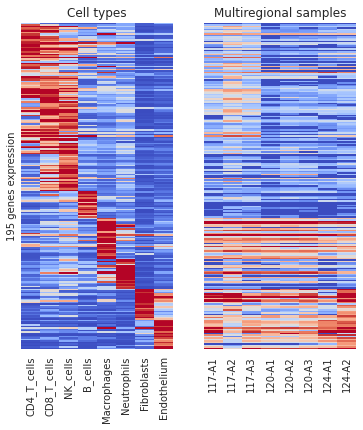

In [72]:
so = ann[ann.DNA == 1].index

af = axis_net(2, 1, x_len=3, y_len=6)

cell_profiles_expr_tmp = cell_profiles.loc[['CD4_T_cells','CD8_T_cells', 'NK_cells', 'B_cells',
    'Macrophages', 'Neutrophils', 'Fibroblasts', 'Endothelium']].T.loc[cell_profile_genes]

vmax_selected = .8*cell_profiles_expr_tmp.max().max()


ax = sns.heatmap(cell_profiles_expr_tmp, yticklabels=[],
                   cmap=default_cmap, cbar=False, ax=next(af), vmax=8)
ax.set_title('Cell types')
ax.set_ylabel('195 genes expression')


ax = sns.heatmap(multireg_expr.loc[cell_profile_genes, so], 
               yticklabels=[], cmap=default_cmap, vmin=0, vmax=8, cbar=False, ax=next(af))
ax.set_title('Multiregional samples')
ax.set_ylabel('')

# snRNA

## Umaps

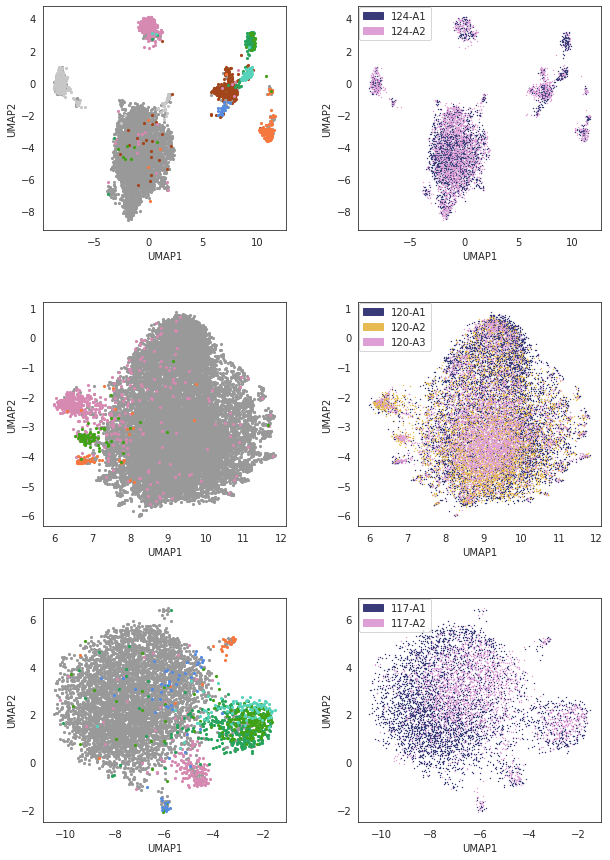

In [74]:
with sns.axes_style('white'):
    af = axis_net(2, 3, x_len=5, y_len=5)

for pat, mut_genes_number, pat_fulls in zip(['124', '120', '117'], [5, 5, 10],
    [['124-A1', '124-A2'], ['120-A1', '120-A2', '120-A3'], ['117-A1', '117-A2']]):

    tmp = read_dataset('./data/snRNA/snRNA_coord/A{}_UMAP_coordinates.csv'.format(pat), sep=',')
    if pat == '117':
        tmp.index = [x.split('_')[2] + '_' + x.split('_')[1] + '-' + x.split('_')[0] for x in tmp.index]
    else:        
        tmp.index = [x[:-1]+ pat + '-A' + x[-1] for x in tmp.index]

    tmp_cell_type = read_dataset('./data/snRNA/snRNA_coord/A{}_annotation.csv'.format(pat), sep=',')
    if pat == '117':
        tmp_cell_type.index = [x.split('_')[2] + '_' + x.split('_')[1] + '-' + x.split('_')[0] for x \
                               in tmp_cell_type.index]
    else:        
        tmp_cell_type.index = [x[:-1]+ pat + '-A' + x[-1] for x in tmp_cell_type.index]

    
    tmp['Sample'] = [x[-6:] for x in tmp_cell_type.index]
    tmp_cell_type = tmp_cell_type['cell_type']
        
    
#### plot with cell_type

    ax = next(af)
    
    for cell_type in ['Tumor','Fibroblasts','Macrophages','normal_kidney',
                      'Endothelium','CD4_T_cells','T_cells' ,'CD8_T_cells' ,'B_cells']:
        ind = tmp_cell_type[tmp_cell_type == cell_type].index
    
        ax = simple_palette_scatter(tmp.UMAP1[ind], tmp.UMAP2[ind], grouping=tmp_cell_type, 
            palette=cells_p_snRNA, linewidth=0, s=10, legend=False, ax=ax)
        ax.grid(False)
    
    ax.grid(False)    
    
    
### plot tsne with Samples

    ax = simple_palette_scatter(tmp.UMAP1, tmp.UMAP2, grouping=tmp.Sample, 
        palette=lin_colors(tmp.Sample, cmap=matplotlib.cm.tab20b), 
        linewidth=0, s=2, legend=True, ax=next(af))
    ax.grid(False)    

    
plt.subplots_adjust(wspace=.3, hspace=.32)

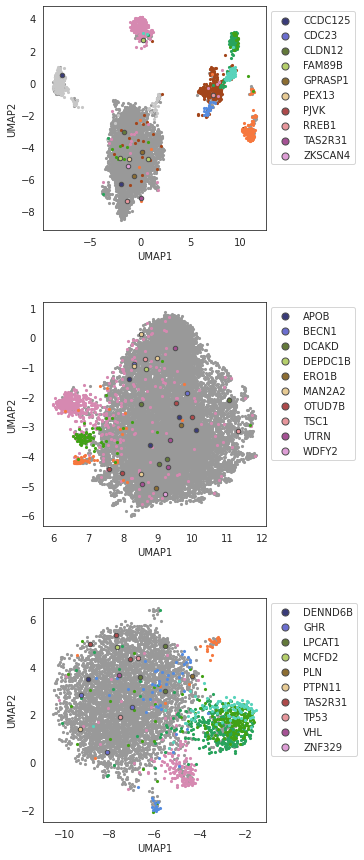

In [75]:
with sns.axes_style('white'):
    af = axis_net(1, 3, x_len=4, y_len=5)

for pat, mut_genes_number, pat_fulls in zip(['124', '120', '117'], [5, 5, 10],
    [['124-A1', '124-A2'], ['120-A1', '120-A2', '120-A3'], ['117-A1', '117-A2']]):
    
    tmp = read_dataset('./data/snRNA/snRNA_coord/A{}_UMAP_coordinates.csv'.format(pat), sep=',')
    if pat == '117':
        tmp.index = [x.split('_')[2] + '_' + x.split('_')[1] + '-' + x.split('_')[0] for x in tmp.index]
    else:        
        tmp.index = [x[:-1]+ pat + '-A' + x[-1] for x in tmp.index]

    tmp_cell_type = read_dataset('./data/snRNA/snRNA_coord/A{}_annotation.csv'.format(pat), sep=',')
    if pat == '117':
        tmp_cell_type.index = [x.split('_')[2] + '_' + x.split('_')[1] + '-' + x.split('_')[0] for x \
                               in tmp_cell_type.index]
    else:        
        tmp_cell_type.index = [x[:-1]+ pat + '-A' + x[-1] for x in tmp_cell_type.index]

    
    tmp['Sample'] = [x[-6:] for x in tmp_cell_type.index]
    tmp_cell_type = tmp_cell_type['cell_type']
        
    
### data for tsne with mutations

    tmp_maf = []
    for maf_path in glob('./data/snRNA/TWDN-WUR-{}-*/cellSNP.maf'.format(pat)):

        tmp_submaf = read_dataset(maf_path)
        tmp_submaf.Tumor_Sample_Barcode = tmp_submaf.Tumor_Sample_Barcode + '_' + maf_path.split('WUR-')[1].split('/')[0]
        tmp_maf.append(tmp_submaf)

    tmp_maf = pd.concat(tmp_maf)
    
    go_tmp = tmp_maf.Hugo_Symbol.value_counts().index[::-1][:10]
    go_tmp = go_tmp[['HLA-' not in x for x in go_tmp]] # filter HLA genes

    cells_mut_ann = tmp_maf[tmp_maf.Hugo_Symbol.isin(go_tmp)].set_index('Tumor_Sample_Barcode')['Hugo_Symbol']
    cells_mut_ann = cells_mut_ann[~cells_mut_ann.index.duplicated(keep='first')]
    cells_mut_pal = lin_colors(cells_mut_ann, cmap=matplotlib.cm.tab20b)

    cells_mut_ann = cells_mut_ann.append(pd.Series('AAAAA', index=tmp.index ^ cells_mut_ann.index))
    cells_mut_pal.update({'AAAAA': '#d1d1d1'}) # AAAA - for cells without mutations 

    
#### plot with mutations and cell_type

    ax = next(af)
    
    for cell_type in ['Tumor','Fibroblasts','Macrophages','normal_kidney',
                      'Endothelium','CD4_T_cells','T_cells' ,'CD8_T_cells' ,'B_cells']:
        ind = tmp_cell_type[tmp_cell_type == cell_type].index
    
        ax = simple_palette_scatter(tmp.UMAP1[ind], tmp.UMAP2[ind], grouping=tmp_cell_type, 
            palette=cells_p_snRNA, linewidth=0, s=10, legend=False, ax=ax)
        ax.grid(False)
    
    ax = simple_palette_scatter(tmp.UMAP1, tmp.UMAP2, grouping=cells_mut_ann[cells_mut_ann != 'AAAAA'], 
        palette=cells_mut_pal, linewidth=1, s=20, legend=False, ax=ax, edgecolor='#4d4d4d', order=go_tmp)
    ax.grid(False)
    
    cells_mut_pal.pop('AAAAA')
    
    legend_markers = [plt.scatter([],[], s=50, color=it[1], linewidth=1, edgecolor='#4d4d4d', label=it[0]) for it in \
         cells_mut_pal.items()]

    ax.grid(False)
    ax.legend(bbox_to_anchor=(1, 1), loc=2, handles=legend_markers)
    

plt.subplots_adjust(wspace=.3, hspace=.32)

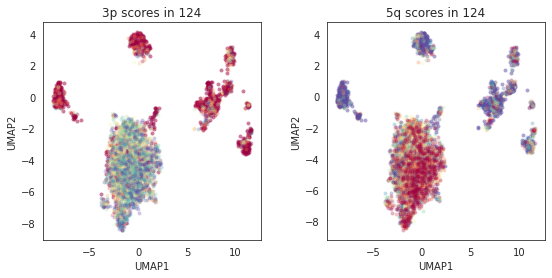

In [76]:
for pat in ['124']:

    tmp_cna = read_dataset('./data/snRNA/TWDN-WUR-{}/cna_data_scaled.tsv.gz'.format(pat), sep=',')
    
    tmp = read_dataset('./data/snRNA/snRNA_coord/A{}_UMAP_coordinates.csv'.format(pat), sep=',')
    if pat == '117':
        tmp.index = [x.split('_')[2] + '_' + x.split('_')[1] + '-' + x.split('_')[0] for x in tmp.index]
    else:        
        tmp.index = [x[:-1]+ pat + '-A' + x[-1] for x in tmp.index]

    tmp_cell_type = read_dataset('./data/snRNA/snRNA_coord/A{}_annotation.csv'.format(pat), sep=',')
    if pat == '117':
        tmp_cell_type.index = [x.split('_')[2] + '_' + x.split('_')[1] + '-' + x.split('_')[0] for x \
                               in tmp_cell_type.index]
    else:        
        tmp_cell_type.index = [x[:-1]+ pat + '-A' + x[-1] for x in tmp_cell_type.index]

    
    tmp['Sample'] = [x[-6:] for x in tmp_cell_type.index]
    tmp_cell_type = tmp_cell_type['cell_type']
    
    tmp_sample = pd.Series([x.split('_')[1] for x in tmp_cell_type.index], index=tmp_cell_type.index)

    with sns.axes_style('white'):
        af = axis_net(2, 1, x_len=4.5, y_len=4)
   
    for cna, flag, pal in zip(['3p', '5q'], [-1, 1], 
                              [cytof_marker_intensity_pal, cytof_marker_intensity_pal_r]):
        
        ax = next(af)
        
        for sample in sorted(set(tmp_sample)):
            
            index_tmp = tmp_sample[tmp_sample == sample].index
        
            groups_by_marker = to_linear_ranges((flag*tmp_cna.loc[index_tmp, cna]).clip(
                np.percentile(flag*tmp_cna.loc[index_tmp, cna], 20), 
                np.percentile(flag*tmp_cna.loc[index_tmp, cna], 80)), ps=np.arange(0, 1, .1))

            ax = simple_palette_scatter(tmp.UMAP1[index_tmp], tmp.UMAP2[index_tmp], 
                groups_by_marker.apply(lambda x: float(x.split('p')[0])), 
                palette=pal, linewidth=0, s=15, ax=ax, legend=False, alpha=.3)
            ax.grid(False)
            ax.set_title(cna+' scores in '+pat)
    
    plt.subplots_adjust(wspace=.3)

## 124-A2 cell heatmap

In [77]:
snRNA_expr_124a2 = read_dataset('./data/snRNA/TWDN-WUR-124-A2/annotated_cells_counts.tsv.gz', sep=',')

snRNA_expr_124a2.shape

(37644, 2727)

In [78]:
snRNA_expr_124a2.columns = snRNA_expr_124a2.columns + '_2'

In [79]:
snRNA_ann_124a2 = read_dataset('./data/snRNA/TWDN-WUR-124-A2/A124_annotation.csv', sep=',')['cell_type']
snRNA_ann_124a2.shape

(5560,)

In [80]:
snRNA_expr_by_cell = pd.concat([snRNA_expr_124a2.T, snRNA_ann_124a2.loc[snRNA_expr_124a2.columns]
          ], axis=1).groupby(by='cell_type').mean()

In [81]:
snRNA_expr_by_cell_scaled = snRNA_expr_by_cell.apply(scale)

In [82]:
gmt = read_gene_sets('./data/immune_processes-all.gmt')

<AxesSubplot:xlabel='cell_type'>

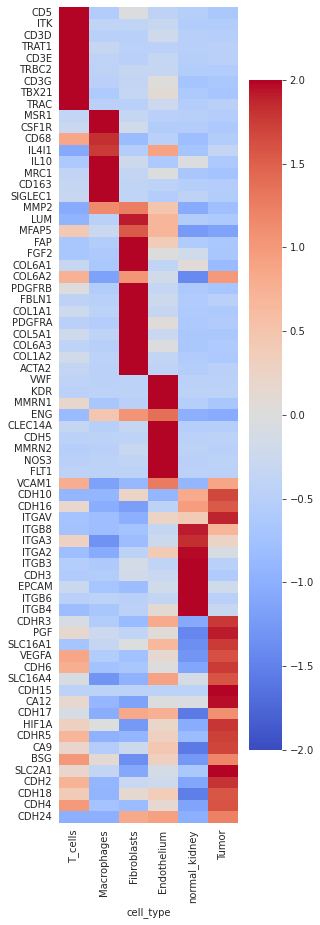

In [83]:
genes_tmp = list(gmt['T_cells'].genes) + list(gmt['Macrophages'].genes) + \
    list(gmt['CAF'].genes) + list(gmt['Endothelium'].genes) + \
    list(['CDH10', 'CDH16', 'ITGAV']) + \
    list(['ITGB8', 'ITGA3', 'ITGA2', 'ITGB3', 'CDH3', 'EPCAM', 'ITGB6', 'ITGB4', ]) + \
    list(['CDHR3', 'PGF', 'SLC16A1', 'VEGFA', 'CDH6', 'SLC16A4', \
       'CDH15', 'CA12', 'CDH17', 'HIF1A', 'CDHR5', 'CA9', \
       'BSG', 'SLC2A1', 'CDH2', 'CDH18', 'CDH4', 'CDH24'])

for g in ['CD28', 'CD248', 'LRP1', 'MMP3', 'CXCL12']:
    genes_tmp.remove(g)

ax = axis_net(1, 1, y_len=15, x_len=4)

sns.heatmap(snRNA_expr_by_cell_scaled.reindex(
    ['T_cells',  'Macrophages', 'Fibroblasts', 'Endothelium', 'normal_kidney', 'Tumor',], 
    genes_tmp).T.dropna(), cmap=default_cmap, vmax=2, vmin=-2, ax=ax)

## Pseudo-bulk

In [84]:
snRNA_expr_tumor_filt = pd.read_table('./data/snRNA/pseudobulk_df_by_features.tsv',
            sep=',', index_col=0)

snRNA_expr_tumor_filt.columns = [x[-6:] for x in snRNA_expr_tumor_filt.columns]
snRNA_expr_tumor_filt.columns = snRNA_expr_tumor_filt.columns + '-snRNA-tumor-filt-by-df'
snRNA_expr_tumor_filt = snRNA_expr_tumor_filt.loc[snRNA_expr_tumor_filt.index & multireg_expr.index]
snRNA_expr_tumor_filt = (snRNA_expr_tumor_filt.div(snRNA_expr_tumor_filt.sum())*1000000)
snRNA_expr_tumor_filt = np.log2(1+snRNA_expr_tumor_filt)
print(snRNA_expr_tumor_filt.shape)

(18795, 7)


In [85]:
snRNA_expr_immune = pd.read_table('./data/snRNA/pseudobulk_immune_cells_kb.tsv',
            sep=',', index_col=0)

snRNA_expr_immune.columns = [x[-6:] for x in snRNA_expr_immune.columns]
snRNA_expr_immune.columns = snRNA_expr_immune.columns + '-snRNA-immune-cells'
snRNA_expr_immune = snRNA_expr_immune.loc[snRNA_expr_immune.index & multireg_expr.index]
snRNA_expr_immune = (snRNA_expr_immune.div(snRNA_expr_immune.sum())*1000000)
snRNA_expr_immune = np.log2(1+snRNA_expr_immune)
print(snRNA_expr_immune.shape)

(20062, 7)


In [86]:
tech_ann = pd.Series('bulk', multireg_expr.columns)
tech_ann.loc[multireg_expr.columns] = 'bulk'
tech_ann = tech_ann.append(pd.Series('snRNA-immune-cells', index=snRNA_expr_immune.columns))
tech_ann = tech_ann.append(pd.Series('snRNA-tumor-filt', index=snRNA_expr_tumor_filt.columns))

samples_ann = pd.Series([x[:6] for x in tech_ann.index], index=tech_ann.index)

In [87]:
bulk_sn_expr_concat = pd.concat([2**(multireg_expr)-1, 2**(snRNA_expr_immune)-1, 
                         2**(snRNA_expr_tumor_filt) - 1], 
              axis=1).dropna()
bulk_sn_expr_concat.shape

bulk_sn_expr_concat = bulk_sn_expr_concat.div(bulk_sn_expr_concat.sum())*1000000
bulk_sn_expr_concat = np.log2(bulk_sn_expr_concat + 1)

In [88]:
unique_cytos_list = ['CXCL9', 'CXCL10', 'CXCL11', 'CX3CL1', 'CCL5', 'CCL3', 'CCL4', 'CXCL13',
 'CXCL12', 'CCL19', 'CCL21', 'CXCL8', 'CCL20', 'MIF', 'TNFSF13B', 'CCL2', 'CCL7', 'CCL8', 'XCL1',
 'CSF1', 'CSF2', 'CSF3', 'CXCL1', 'CXCL2', 'CXCL5', 'CCL11', 'KITLG', 'CCL26', 'IL6', 'CCL1',
 'TGFB1', 'TGFB2', 'TGFB3', 'PDGFD', 'PDGFA', 'PDGFC', 'ITGA9', 'ITGB1']

In [89]:
cyto_ext = multireg_expr.loc[list(unique_cytos_list), multireg_samples_order]
cyto_ext = cyto_ext.loc[cyto_ext.max(axis=1) > 2]
cyto_ms_ext = median_scale(cyto_ext.T, clip=3).fillna(-3).T

In [90]:
cytokines_meth =  pd.read_table('./data/methylation/cytokines_methylation.tsv', index_col=0)

In [91]:
cvals  = [-2.5, -1, 0, 1, 2.5]
intensity_pal_r = lin_colors(pd.Series(np.arange(0, 1, .1)), cmap=matplotlib.cm.Spectral_r)
colors = [intensity_pal_r[0], 
          intensity_pal_r[0.1], 
          '#faecb6',  
          intensity_pal_r[0.8], 
          intensity_pal_r[.9]]

norm = plt.Normalize(min(cvals), max(cvals))
tuples = list(zip(map(norm, cvals), colors))
heatmap_cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", tuples)

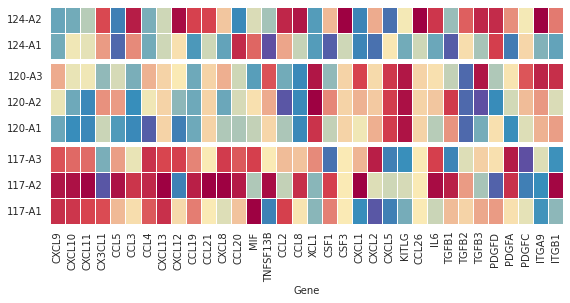

In [92]:
rev_columns = multireg_samples_order[::-1]

af = axis_matras([1, 1.5, 1.5], x_len=9.2, title_y=0, sharex=True)

ax = next(af)
sns.heatmap(cyto_ms_ext[rev_columns[0:2]].T, cbar=False, cmap=heatmap_cmap, ax=ax, linewidths=1)
ax.tick_params(axis='x', length=0)

ax = next(af)
sns.heatmap(cyto_ms_ext[rev_columns[2:5]].T, cbar=False, cmap=heatmap_cmap, ax=ax, linewidths=1)
ax.tick_params(axis='x', length=0)

ax = next(af)
sns.heatmap(cyto_ms_ext[rev_columns[5:8]].T, cbar=False, cmap=heatmap_cmap, ax=ax, linewidths=1)

plt.subplots_adjust(wspace=0, hspace=0.065)

In [93]:
expr_pal = {'bulk': '#e39102', 
            'snRNA-immune-cells': '#3fb319', 
            'snRNA-tumor-filt': '#b34219'}

expr_types_order = ['snRNA-tumor-filt', 'snRNA-immune-cells']

cytokine_genes = ['CCL4', 'CCL5', 'CXCL1', 'CD274', 'CXCL10', 'CXCL11', 'CXCL13', 'TNFSF13B']

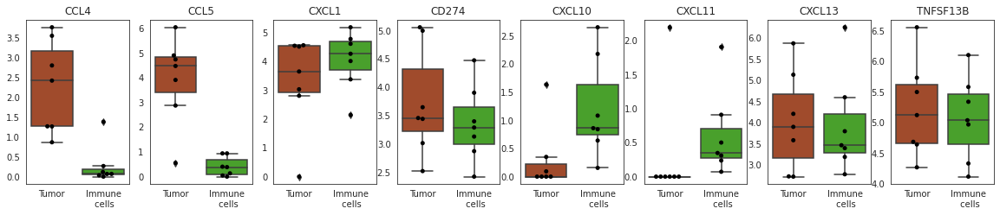

In [94]:
y = len(cytokine_genes)
x = 1
x_len = 2.5
y_len = 3.5
fig, axs = plt.subplots(x, y, figsize=(y * x_len, x * y_len))
af = axs.flat

for gene in cytokine_genes:
    gene_expr = bulk_sn_expr_concat.loc[gene] 
    ax = next(af)
    sns.boxplot(y=gene_expr, x=tech_ann[tech_ann.isin(expr_types_order)], ax=ax,
                             palette=expr_pal, order=expr_types_order)
    sns.swarmplot(y=gene_expr, x=tech_ann[tech_ann.isin(expr_types_order)], ax=ax,
                             order=expr_types_order, color='black')
    ax.set_ylabel('')
    ax.set_xticklabels(['Tumor', 'Immune\n cells'])
    ax.set_title(gene)

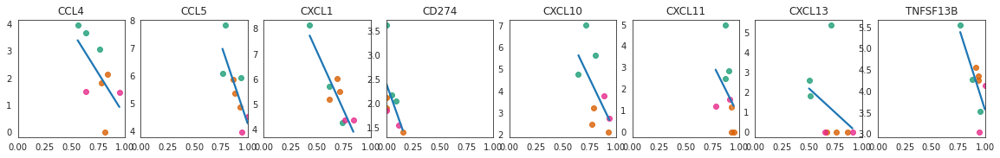

In [95]:
N = len(cytokine_genes)

y = N
x = 1
x_len = 2.5
y_len = 2.5
fig, axs = plt.subplots(x, y, figsize=(y * x_len, x * y_len))
af = axs.flat


for j in range(len(cytokine_genes)):
    ax=next(af)
    gene_inter = cytokine_genes[j]
    single_gene_meth = cytokines_meth.query('gene in @gene_inter').iloc[0]
    single_gene_expr = multireg_expr.loc[gene_inter]
    
    sns.regplot(x=single_gene_meth.loc[multireg_samples_order[0:3]].astype(float).values, 
                y=single_gene_expr[multireg_samples_order[0:3]].astype(float).values,
                ci=0, fit_reg=False, color=samples_pal['117'], ax=ax)
    
    sns.regplot(x=single_gene_meth.loc[multireg_samples_order[3:6]].astype(float).values, 
                y=single_gene_expr[multireg_samples_order[3:6]].astype(float).values,
                ci=0, fit_reg=False, color=samples_pal['120'], ax=ax)
    
    sns.regplot(x=single_gene_meth.loc[multireg_samples_order[6:9]].astype(float).values, 
                y=single_gene_expr[multireg_samples_order[6:9]].astype(float).values,
                ci=0, fit_reg=False, color=samples_pal['124'], ax=ax)
        
    sns.regplot(x=single_gene_meth.loc[multireg_samples_order].astype(float).values, 
                y=single_gene_expr[multireg_samples_order].astype(float).values,
                ci=0, fit_reg=True, scatter_kws={'alpha':0}, ax=ax)
    ax.set_xlim(0, 1)
    ax.set_title(gene_inter)
    
plt.subplots_adjust(wspace=.15, hspace=.15)
plt.rcParams['figure.dpi']=200
plt.rcParams['axes.labelsize'] = 10

In [96]:
immune_genes = ['CCL2', 'CCL3', 'CCL4', 'CCL5', 'IL16',  'CXCL9', 'CXCL10', 'CXCL11']
malignant_genes = ['TGFB1', 'TGFB2', 'PDGFD', 'ITGA9']
genes = immune_genes + malignant_genes

bulk_data = median_scale(multireg_expr.loc[genes, multireg_samples_order].T, clip=3).T.replace(0, np.nan)
bulk_copy = bulk_data.copy()
bulk_copy['gene_type'] = 'Immune'
bulk_copy.loc[malignant_genes, 'gene_type'] = 'Malignant cells'
bulk_immune_malign = bulk_copy.groupby('gene_type').mean()


pseudobulk_data = median_scale(pd.concat([
    snRNA_expr_tumor_filt.reindex(index=genes, 
                                  columns=(multireg_samples_order + '-snRNA-tumor-filt-by-df')),
    snRNA_expr_immune.reindex(index=genes, 
                              columns=(multireg_samples_order + '-snRNA-immune-cells'))], 
    axis=1).T, clip=3).T.replace(0, np.nan)

pseudobulk_copy = pseudobulk_data.copy()
pseudobulk_copy['gene_type'] = 'Immune'
pseudobulk_copy.loc[malignant_genes, 'gene_type'] = 'Malignant cells'
pseudobulk_immune_malign = pseudobulk_copy.groupby('gene_type').mean()


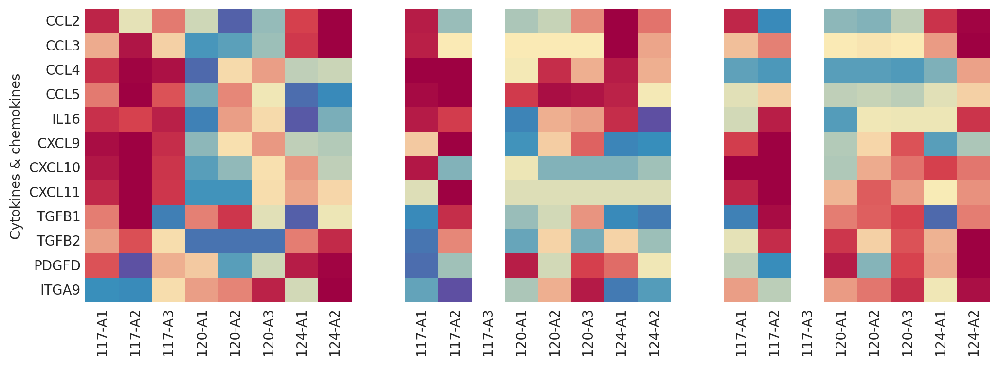

In [97]:
y = 3
x = 1
x_len = 4
y_len = 4
fig, axs = plt.subplots(x, y, figsize=(y * x_len, x * y_len))
af = axs.flat

ax=next(af)
sns.heatmap(median_scale(multireg_expr.loc[genes, multireg_samples_order].T).T.replace(0, np.nan), 
            cbar=False, cmap=heatmap_cmap, vmin=-2.5, vmax=2., ax=ax)
ax.set_ylabel('Cytokines & chemokines')
ax.tick_params(length=0)
ax.set_xticklabels(multireg_samples_order)
ax.set_facecolor('white')


for expr_suffix in ['-snRNA-tumor-filt-by-df', '-snRNA-immune-cells']:
    ax=next(af)
    sns.heatmap(pseudobulk_data.loc[genes, multireg_samples_order + expr_suffix], 
                cbar=False, cmap=heatmap_cmap, vmin=-2.5, vmax=2.2, ax=ax,
                 linewidths=0)

    ax.tick_params(length=0)
    ax.set_xticklabels(multireg_samples_order)
    ax.set_facecolor('white')
    ax.set_ylabel('')
    ax.set_yticklabels('')

plt.subplots_adjust(hspace=.1, wspace=.2)

# Methylation

In [98]:
multir_meth = read_dataset('./data/methylation/illumina_450k_beta.tsv.gz')
multir_meth.shape

multir_meth.columns = [x[9:15].replace('.', '-') for x in multir_meth.columns]

In [99]:
deconv_cpg = read_dataset('./data/methylation/ccRCC_TCGA_150_Signature.txt')

In [100]:
single_color_cmap_r = sns.cubehelix_palette(as_cmap=True, light=0.97, reverse=True)

In [101]:
cpgs_reordered = read_dataset(
    './data/methylation/cpgs_order_for_methylation_heatmap_profiles.tsv')['0'].values

In [102]:
len(cpgs_reordered)

2043

In [103]:
meth_cells_map = {'Cancer': 'tumor_and_other', 'CD14': 'Macrophages', 'CD19': 'B_cells', 
 'CD4_Eff': 'CD4_T_cells', 'CD56': 'NK_cells', 'CD8': 'CD8_T_cells', 
 'Endothelial': 'Endothelium', 'Eos': 'Eosinophils', 
 'Fibroblast': 'Fibroblasts', 'Neu': 'Neutrophils', 'Treg': 'Tregs'}

Text(0.5, 1.0, 'Multiregional samples')

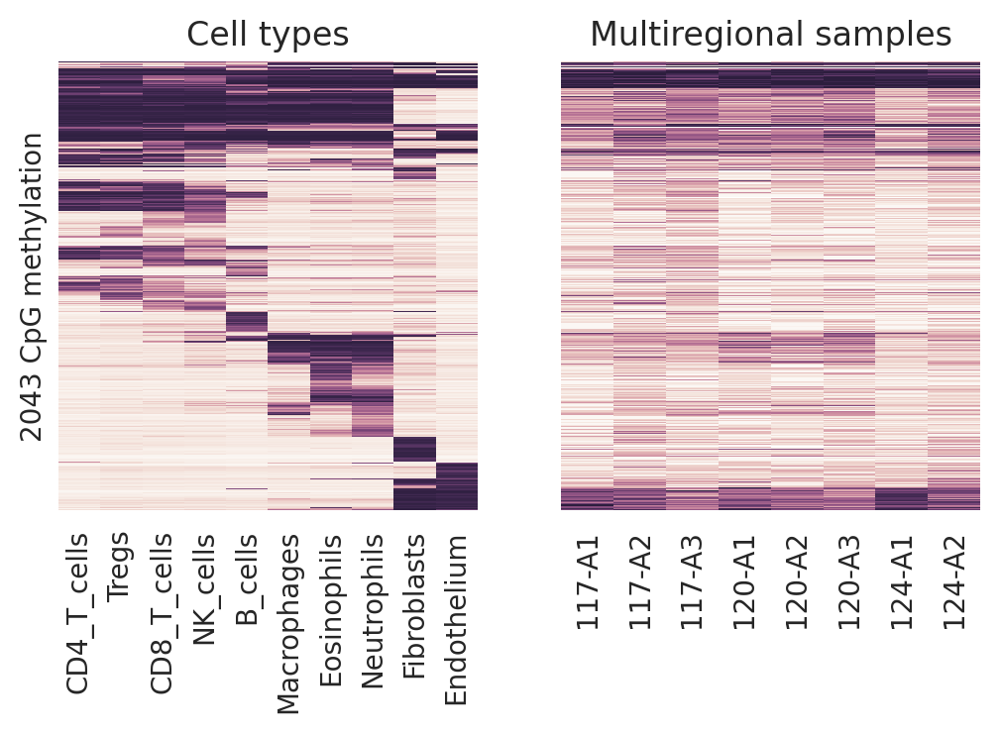

In [104]:
af = axis_net(2, 1, x_len=3, y_len=3)

ax = sns.heatmap(deconv_cpg.loc[cpgs_reordered, ['CD4_Eff', 'Treg', 'CD8','CD56', 'CD19', 
       'CD14', 'Eos', 'Neu','Fibroblast','Endothelial']].rename(meth_cells_map, axis=1).rename(
    {'tumor_and_other': 'Tumor_cells'}, axis=1), 
               cmap=single_color_cmap_r, ax=next(af), yticklabels=[], cbar=False)
ax.set_ylabel('2043 CpG methylation')
ax.set_title('Cell types')

ax = sns.heatmap(multir_meth.reindex(cpgs_reordered), 
           cmap=single_color_cmap_r, ax=next(af), yticklabels=[], cbar=False)
ax.set_xticklabels(multir_meth.columns)
ax.set_ylabel('')
ax.set_title('Multiregional samples')

# Compare deconvolution

In [105]:
cytof_main = read_dataset('./data/cytof/cells_perc.tsv').T

In [106]:
mxif_perc = read_dataset('./data/mxif/mxif_cells.tsv')

mxif_perc = mxif_perc.rename({'b_cells': 'B_cells', 'CD4': 'CD4_T_cells', 'CD8': 'CD8_T_cells',
                  'macro': 'Macrophages'})

mxif_perc = mxif_perc.div(mxif_perc.sum())

In [107]:
cells_deconv_new = read_dataset('./data/expression_deconvolution.tsv').T/100

cells_deconv_new.columns = [x[-6:] for x in cells_deconv_new.columns]

In [108]:
meth_cells_map = {'Cancer': 'tumor_and_other', 'CD14': 'Macrophages', 'CD19': 'B_cells', 
 'CD4_Eff': 'CD4_T_cells', 'CD56': 'NK_cells', 'CD8': 'CD8_T_cells', 
 'Endothelial': 'Endothelium', 'Eos': 'Eosinophils', 
 'Fibroblast': 'Fibroblasts', 'Neu': 'Neutrophils', 'Treg': 'Tregs'}

In [109]:
meth_cells = read_dataset('./data/methylation/ccRCC_TCGA_150.txt')

meth_cells.index = [x[9:15].replace('.', '-') for x in meth_cells.index]

meth_cells = meth_cells.iloc[:, :-3].T

meth_cells.index = [meth_cells_map[x] for x in meth_cells.index]

meth_cells.loc['Neutrophils'] = meth_cells.loc['Neutrophils'] + meth_cells.loc['Eosinophils']
meth_cells.loc['T_cells'] = meth_cells.loc['CD4_T_cells'] + \
    meth_cells.loc['CD8_T_cells'] + meth_cells.loc['Tregs']

meth_cells = meth_cells.drop(['Eosinophils'])

In [110]:
snRNA_cells_new = []

for path in glob('./data/snRNA/A*_annotation.csv'):
    
    tmp = read_dataset(path, sep=',')
    tmp['sample'] = [path.split('/')[-1][1:4] + '-A' + x[-1] for x in tmp.index]
    
    for pat in set(tmp['sample']):
        snRNA_cells_new.append(
            pd.Series(
                tmp[tmp['sample'] == pat].cell_type.value_counts()/(
                    tmp[tmp['sample'] == pat].cell_type.value_counts().sum())).rename(pat.replace('_', '-')))
        
snRNA_cells_new = pd.concat(snRNA_cells_new, axis=1)

snRNA_cells_new['117-A3'] = np.nan

In [111]:
cells_deconv_norm = normalize(
    cells_deconv_new.loc[['B_cells', 'CD4_T_cells', 'CD8_T_cells', 'NK_cells',
          'Monocytes','Macrophages', 'Neutrophils',]]) 

cytof_main_norm = normalize(
    cytof_main.loc[['B_cells', 'CD4_T_cells', 'CD8_T_cells', 'NK_cells',
    'Macrophages','Neutrophils',]]) 

meth_cells_norm = normalize(
    meth_cells.loc[['B_cells','T_cells','NK_cells',                     
             'Macrophages', 'Neutrophils']]) 
 
snRNA_cells_norm = normalize(
    snRNA_cells_new.loc[['B_cells','T_cells', 'CD4_T_cells', 'CD8_T_cells', 'Macrophages']]) 
snRNA_cells_norm.loc['NK_cells'] = np.nan
snRNA_cells_norm.loc['Neutrophils'] = np.nan
snRNA_cells_norm['117-A3'] = np.nan

In [112]:
mxif_perc_norm = normalize(   
    mxif_perc.loc[['B_cells', 'CD4_T_cells', 'CD8_T_cells', 'Macrophages',]]) 
mxif_perc_norm.loc['NK_cells'] = np.nan
mxif_perc_norm.loc['Neutrophils'] = np.nan

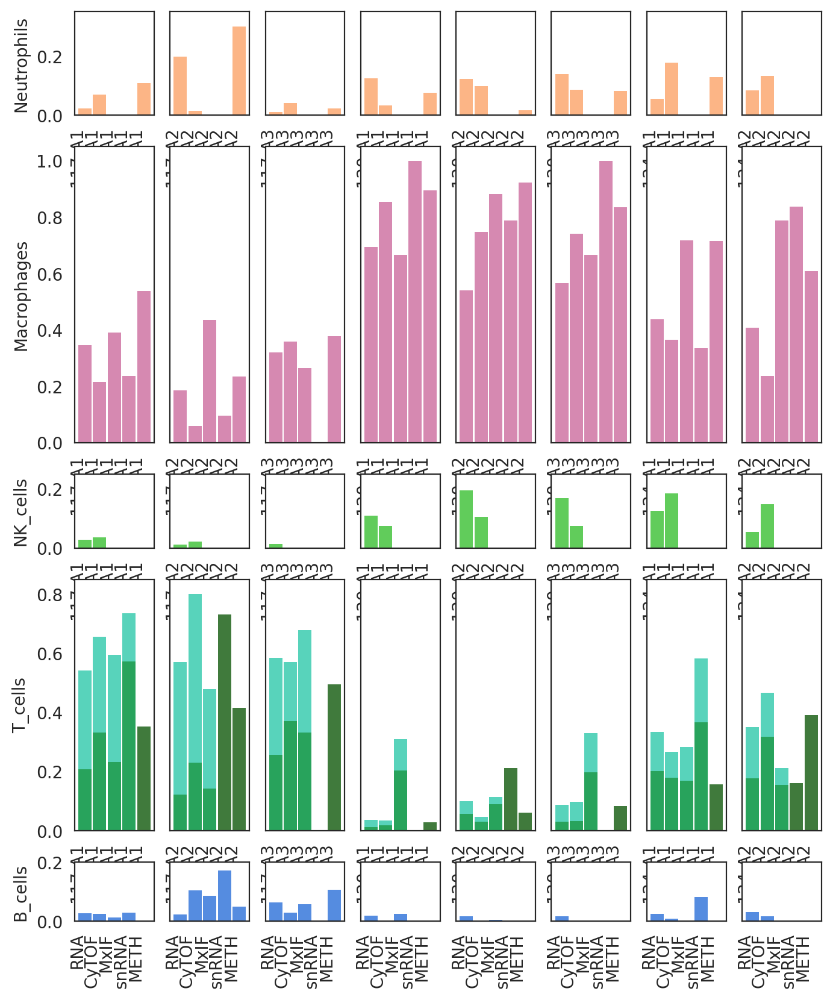

In [113]:
af = axis_net(8, 5, x_len=1, y_len=2, gridspec_kw={'height_ratios': [.35, 
    1, .25, 
    .85, .2]})
so = ann[ann.RNA == 1].index

for cell, ylims, ylabel in zip([['Neutrophils'], 
                                ['Macrophages'],
                                ['NK_cells'], 
                                ['CD4_T_cells', 'CD8_T_cells', 'T_cells'],['B_cells'],],
        [[0, .35], 
         [0, 1.05], [0, .25],
         [0, .85],  
            [0, .2],   ],
        ['Neutrophils', 
         'Macrophages', 'NK_cells', 
         'T_cells', 'B_cells', ]):

    for pat in ann[ann.RNA == 1].index:

        ax = bot_bar_plot(
            pd.concat([cells_deconv_norm.reindex(cell)[so], 
                       cytof_main_norm.reindex(cell)[so],
                       mxif_perc_norm.reindex(cell)[so],   
                       snRNA_cells_norm.reindex(cell)[so],  
                       meth_cells_norm.reindex(cell)[so],                  
                      ], axis=1)[[pat]].T.fillna(0), 
                          palette={x: cells_p_all[x] for x in cell}, 
            legend=False, title=pat, ax=next(af), xl=False)
        
        if cell != ['Neutrophils']:
            ax.set_title('')
        
        if pat != '117-A1':
            ax.set_yticklabels([])
        else:
            ax.set_ylabel(ylabel)

        ax.set_ylim(ylims)
        
        if cell == ['B_cells']:
            ax.set_xticklabels(['RNA', 'CyTOF', 'MxIF', 'snRNA', 'METH'], rotation=90)

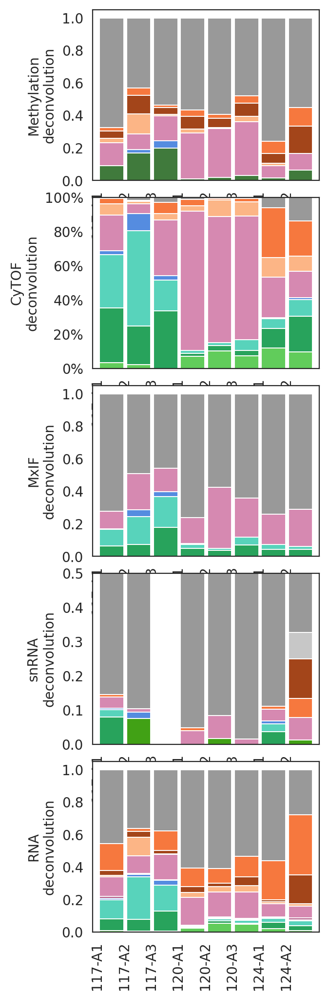

In [114]:
af = axis_net(1, 5, y_len=2.5, x_len=3)

so = ann[ann.RNA == 1].index


ax = bot_bar_plot(meth_cells.loc[['T_cells', 'NK_cells', 'B_cells', 'Macrophages', 
       'Neutrophils',  'Fibroblasts', 'Endothelium','tumor_and_other', ]].T, palette=cells_p_all,
                  lrot=90, legend=False, ax=next(af), xl=False, linewidth=.7)
ax.set_ylabel('Methylation\ndeconvolution')


ax = bot_bar_plot(cytof_main.div(cytof_main.sum()).reindex(cells_o+['Tumor']).rename({'Tumor': 'Other'})[so].T, percent=True,
             palette=cells_p, lrot=90, legend=False, ax=next(af), xl=False, linewidth=.7)
ax.set_ylabel('CyTOF\ndeconvolution')
ax.set_xlabel('')


ax = bot_bar_plot(mxif_perc.reindex(cells_o+['tumor']).rename({'tumor': 'Other'})[so].T.dropna(axis=1), 
             palette=cells_p, ax=next(af), lrot=90, legend=False, xl=False, linewidth=.7)
ax.set_ylabel('MxIF\ndeconvolution')


ax = bot_bar_plot(snRNA_cells_new.loc[['T_cells', 'CD4_T_cells', 'CD8_T_cells', 'B_cells', 
        'Macrophages', 'Endothelium', 'Fibroblasts', 'normal_kidney', 'Tumor', ], so].T, 
          palette=cells_p_snRNA, lrot=90, legend=False, ax=next(af), xl=False, linewidth=.7)
ax.set_ylabel('snRNA\ndeconvolution')
ax.set_ylim(0, .5)


ax = bot_bar_plot(cells_deconv_new.loc[cells_o, so].T, 
             palette=cells_p, lrot=90, legend=False, ax=next(af), xl=False, linewidth=.7)
ax.set_ylabel('RNA\ndeconvolution')


ax.set_xticklabels(so, rotation=90)

plt.subplots_adjust(hspace=.1)

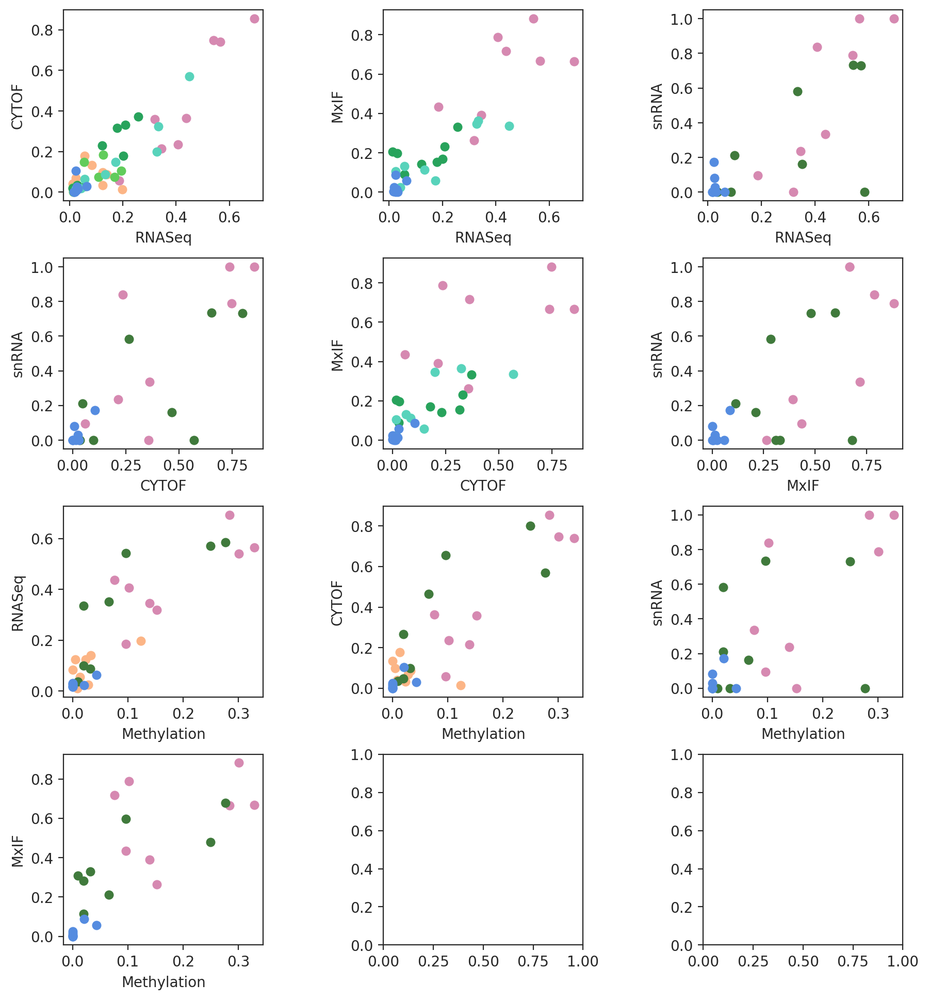

In [115]:
sns.set_style('ticks')

af = axis_net(3, 4, x_len=3.5, y_len=3)
so = ann[ann.RNA == 1].index

for dats, cells, xl, yl in zip([
    [cells_deconv_norm, cytof_main_norm], [cells_deconv_norm, mxif_perc_norm], 
    [cells_deconv_norm, snRNA_cells_norm], [cytof_main_norm, snRNA_cells_norm],
    [cytof_main_norm, mxif_perc_norm], [mxif_perc_norm, snRNA_cells_norm],
    [meth_cells, cells_deconv_norm], [meth_cells, cytof_main_norm],
    [meth_cells, snRNA_cells_norm], [meth_cells, mxif_perc_norm],
    ],
    [
    [['Neutrophils'],['Macrophages'],['NK_cells'],['CD4_T_cells'],['CD8_T_cells'],['B_cells']],
    [['Macrophages'],['CD4_T_cells'],['CD8_T_cells'],['B_cells']],
    [['Macrophages'],['CD4_T_cells', 'CD8_T_cells', 'T_cells'],['B_cells']],
    [['Macrophages'],['CD4_T_cells', 'CD8_T_cells', 'T_cells'],['B_cells']],
    [['Macrophages'],['CD4_T_cells'],['CD8_T_cells'],['B_cells']],
    [['Macrophages'],['CD4_T_cells', 'CD8_T_cells', 'T_cells'],['B_cells']],
    [['Neutrophils'],['Macrophages'],['CD4_T_cells', 'CD8_T_cells', 'T_cells'],['B_cells']],
    [['Neutrophils'],['Macrophages'],['CD4_T_cells', 'CD8_T_cells', 'T_cells'],['B_cells']],
    [['Macrophages'],['CD4_T_cells', 'CD8_T_cells', 'T_cells'],['B_cells']],
    [['Macrophages'],['CD4_T_cells', 'CD8_T_cells', 'T_cells'],['B_cells']],
    ],
    ['RNASeq', 'RNASeq', 'RNASeq', 'CYTOF', 'CYTOF', 'MxIF', 'Methylation', 'Methylation', 'Methylation', 'Methylation'],
    ['CYTOF', 'MxIF', 'snRNA', 'snRNA', 'MxIF', 'snRNA', 'RNASeq', 'CYTOF', 'snRNA', 'MxIF']):
    
    ax = next(af) 
    
    for cell in cells:

        ax = simple_scatter(dats[0].reindex(cell)[so].sum(), dats[1].reindex(cell)[so].sum(), 
                color=cells_p_all[cell[-1]], ax=ax, s=30)
        ax.set_xlabel(xl)
        ax.set_ylabel(yl)
        

plt.subplots_adjust(wspace=.6, hspace=.3)

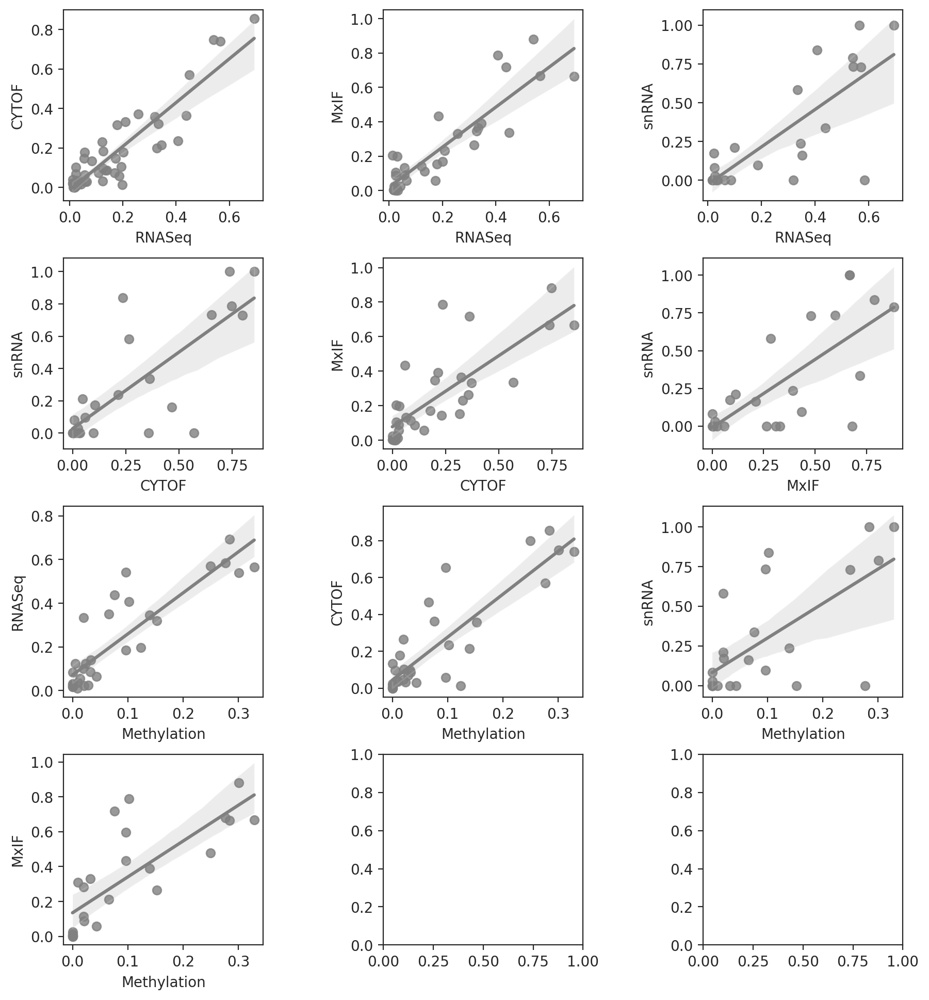

In [116]:
sns.set_style('ticks')

af = axis_net(3, 4, x_len=3.5, y_len=3)
so = ann[ann.RNA == 1].index

for dats, cells, xl, yl in zip([
    [cells_deconv_norm, cytof_main_norm], [cells_deconv_norm, mxif_perc_norm], 
    [cells_deconv_norm, snRNA_cells_norm], [cytof_main_norm, snRNA_cells_norm],
    [cytof_main_norm, mxif_perc_norm], [mxif_perc_norm, snRNA_cells_norm],
    [meth_cells, cells_deconv_norm], [meth_cells, cytof_main_norm],
    [meth_cells, snRNA_cells_norm], [meth_cells, mxif_perc_norm],
    ],
    [
    [['Neutrophils'],['Macrophages'],['NK_cells'],['CD4_T_cells'],['CD8_T_cells'],['B_cells']],
    [['Macrophages'],['CD4_T_cells'],['CD8_T_cells'],['B_cells']],
    [['Macrophages'],['CD4_T_cells', 'CD8_T_cells', 'T_cells'],['B_cells']],
    [['Macrophages'],['CD4_T_cells', 'CD8_T_cells', 'T_cells'],['B_cells']],
    [['Macrophages'],['CD4_T_cells'],['CD8_T_cells'],['B_cells']],
    [['Macrophages'],['CD4_T_cells', 'CD8_T_cells', 'T_cells'],['B_cells']],
    [['Neutrophils'],['Macrophages'],['CD4_T_cells', 'CD8_T_cells', 'T_cells'],['B_cells']],
    [['Neutrophils'],['Macrophages'],['CD4_T_cells', 'CD8_T_cells', 'T_cells'],['B_cells']],
    [['Macrophages'],['CD4_T_cells', 'CD8_T_cells', 'T_cells'],['B_cells']],
    [['Macrophages'],['CD4_T_cells', 'CD8_T_cells', 'T_cells'],['B_cells']],
    ],
    ['RNASeq', 'RNASeq', 'RNASeq', 'CYTOF', 'CYTOF', 'MxIF', 'Methylation', 'Methylation', 'Methylation', 'Methylation'],
    ['CYTOF', 'MxIF', 'snRNA', 'snRNA', 'MxIF', 'snRNA', 'RNASeq', 'CYTOF', 'snRNA', 'MxIF']):
    
    ax = next(af) 
    
    dat_tmp1 = []
    dat_tmp2 = []
    
    for cell in cells:
        dat_tmp1.append(dats[0].reindex(cell)[so].sum())
        dat_tmp2.append(dats[1].reindex(cell)[so].sum())        

    ax = sns.regplot(pd.concat(dat_tmp1).reset_index()[0], pd.concat(dat_tmp2).reset_index()[0], 
                 color='grey', ax=ax)
    ax.set_xlabel(xl)
    ax.set_ylabel(yl)
        

plt.subplots_adjust(wspace=.6, hspace=.3)

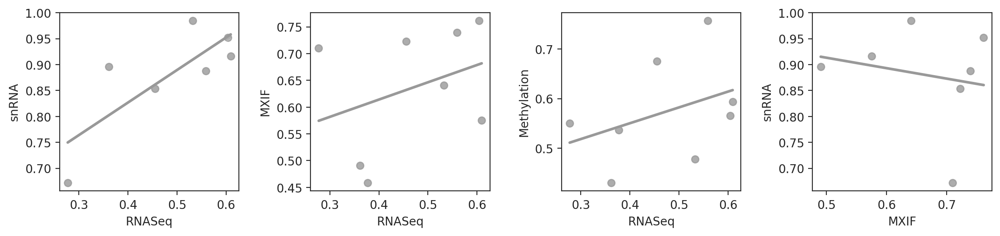

In [117]:
so = ann[ann.RNA == 1].index

af = axis_net(4, 1, y_len=2.8, x_len=3.55)

for dat in [snRNA_cells_new.loc['Tumor'].rename('snRNA'),
            (mxif_perc.loc['tumor']/mxif_perc.sum()).rename('MXIF'), 
           meth_cells.loc['tumor_and_other'].rename('Methylation')]:

    ax = sns.regplot(cells_deconv_new.loc[['Other']].sum().rename('RNASeq'), dat[so], ci=0,
            color=cells_p['tumor_and_other'], ax=next(af))
    
    
ax = sns.regplot((mxif_perc.loc['tumor']/mxif_perc.sum()).rename('MXIF')[so], 
             snRNA_cells_new.loc['Tumor'].rename('snRNA')[so], ci=0,
        color=cells_p['tumor_and_other'], ax=next(af))
    
plt.subplots_adjust(wspace=.4, hspace=.4)

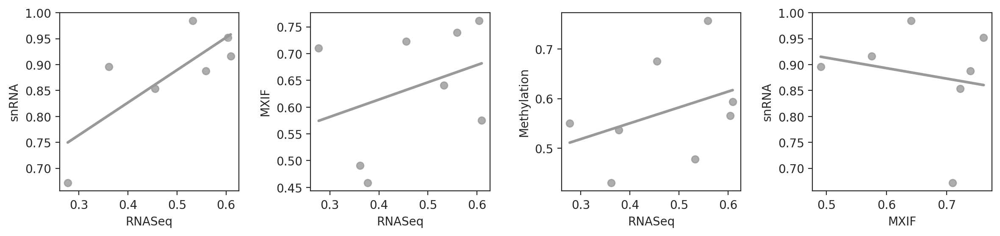

In [118]:
so = ann[ann.RNA == 1].index

af = axis_net(4, 1, y_len=2.8, x_len=3.55)

for dat in [snRNA_cells_new.loc['Tumor'].rename('snRNA'),
            (mxif_perc.loc['tumor']/mxif_perc.sum()).rename('MXIF'), 
           meth_cells.loc['tumor_and_other'].rename('Methylation')]:

    ax = sns.regplot(cells_deconv_new.loc[['Other']].sum().rename('RNASeq'), dat[so], ci=0,
            color=cells_p['tumor_and_other'], ax=next(af))
   
    
    
ax = sns.regplot((mxif_perc.loc['tumor']/mxif_perc.sum()).rename('MXIF')[so], 
             snRNA_cells_new.loc['Tumor'].rename('snRNA')[so], ci=0,
        color=cells_p['tumor_and_other'], ax=next(af))
    
plt.subplots_adjust(wspace=.4, hspace=.4)

In [119]:
endo_mask_mxif = read_dataset('./data/mxif/mxif_endo_mask.tsv').loc['stroma_mask']

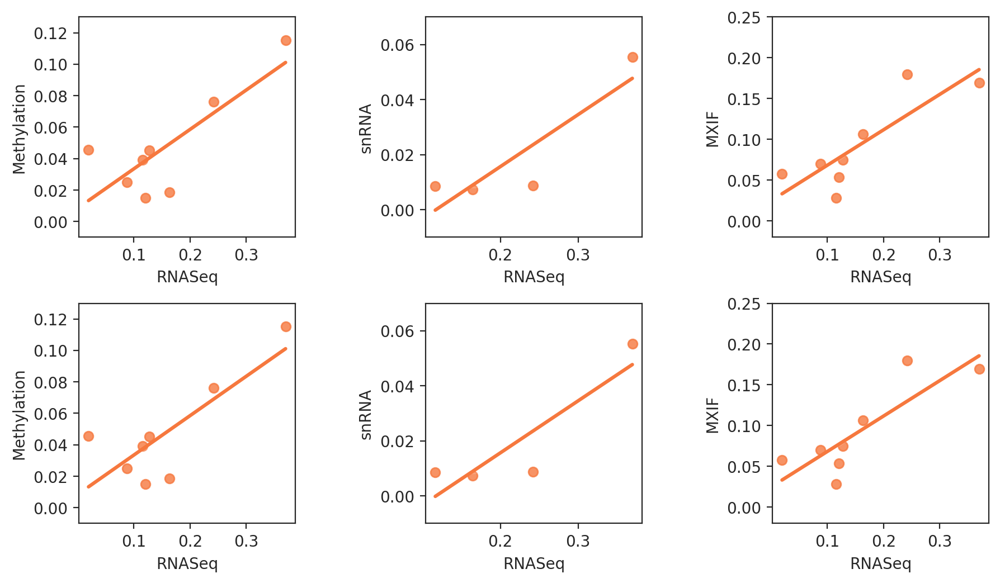

In [120]:
so = ann[ann.RNA == 1].index

af = axis_net(3, 2, y_len=3, x_len=3.5)

for show_pv in [False, True]:
    for dat, ylim, offy in zip([meth_cells.loc['Endothelium'].rename('Methylation')[so],
                                snRNA_cells_new.loc['Endothelium'].rename('snRNA')[so], 
                                endo_mask_mxif.rename('MXIF')[so]*10000000],
                         [[-.01, .13], [-.01, .07], [-.02, .25]], [-0.003, 0.001, -.015]):

        ax = sns.regplot(cells_deconv_new.loc[['Endothelium']].sum().rename('RNASeq')[so], dat, ci=0,
                color=cells_p['Endothelium'], ax=next(af))
        ax.set_ylim(ylim)

plt.subplots_adjust(wspace=.6, hspace=.3)

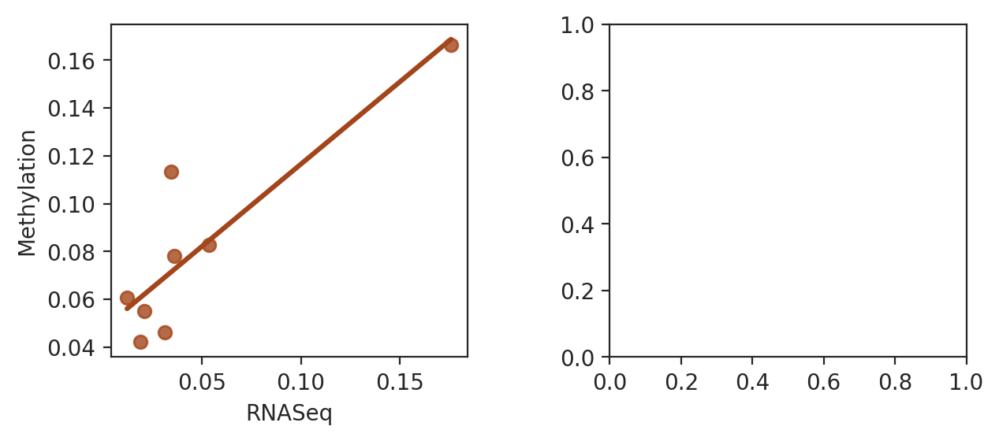

In [121]:
so = ann[ann.RNA == 1].index

af = axis_net(2, 1, y_len=2.8, x_len=3.5)

ax = sns.regplot(cells_deconv_new.loc[['Fibroblasts']].sum().rename('RNASeq')[so], 
         meth_cells.loc['Fibroblasts'].rename('Methylation')[so], ci=0,
        color=cells_p['Fibroblasts'], ax=next(af))


plt.subplots_adjust(wspace=.4, hspace=.4)

# Mutations & CNA

In [122]:
maf = read_dataset('./data/mutations/mutations-dna.maf')
maf_rna = read_dataset('./data/mutations/mutations-rna.maf')
maf_snrna = read_dataset('./data/mutations/mutations-snrna.maf')

In [123]:
pivot_vectors(maf.Sample, maf.Hugo_Symbol)

Sample,117-A1,117-A2,117-A3,120-A1,120-A2,120-A3,124-A1,124-A2
Hugo_Symbol,,,,,,,,
A2M,0,0,1,0,0,0,0,0
AACSP1,1,1,1,0,0,0,0,0
AADACL3,1,0,0,0,0,0,0,0
AASDH,0,0,0,1,1,1,0,0
ABCA1,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...
ZSCAN18,1,0,1,0,0,0,0,0
ZSCAN23,0,0,0,0,0,1,0,0
ZSWIM9,0,0,0,0,0,0,1,0


In [124]:
pivot_vectors(maf_rna.Sample, maf_rna.Hugo_Symbol)

Sample,117-A1,117-A2,117-A3,120-A1,120-A2,120-A3,124-A1,124-A2
Hugo_Symbol,,,,,,,,
AASDH,0,0,0,1,1,1,0,0
ABCA1,0,0,0,1,1,1,0,0
ABCA10,0,0,0,0,0,0,0,1
ABCA3,1,1,1,0,0,0,0,1
ABCC10,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...
ZNF98,1,2,0,0,0,1,0,0
ZNFX1,0,0,0,1,1,1,1,1
ZP3,2,2,2,0,0,0,0,0


In [125]:
pivot_vectors(maf_snrna.Sample, maf_snrna.Hugo_Symbol)

Sample,117-A1,120-A1,120-A2,120-A3,124-A1,124-A2
Hugo_Symbol,,,,,,
AASDH,0,1,1,1,0,0
ACKR4,1,0,0,0,0,0
ACMSD,1,0,0,0,0,0
AHNAK2,0,1,0,1,0,0
AKAP8L,0,0,0,0,0,1
...,...,...,...,...,...,...
VPS11,0,1,1,1,0,0
WDFY2,0,0,1,0,0,0
ZKSCAN4,0,0,0,0,0,1


In [126]:
segments = read_dataset('./data/cna_segments.tsv')

In [127]:
segments[(segments.chrom == 3) & (segments.arm == 'p')]

,chrom,start,end,n_mark,n_h_mark,seg_median,c_fraction,total,minor,seg_length,seg_length_chr,segment_type,arm,margin_segments,segment_cna_status,LOH,segment_cna_combined,norm_total,Sample
5,3,1220790,87800000,12459,578,-0.240132,1.0,2,0,86579210,0.436617,Arm,p,first,Deletion,True,Deletion,-2,TWDN-WUR-117-A2
56,3,1220790,87800000,12031,523,-0.313935,1.0,1,0,86579210,0.436617,Arm,p,first,ShallowDel,True,ShallowDel,-1,TWDN-WUR-117-A3
99,3,1327594,87800000,12241,595,-0.540509,1.0,1,0,86472406,0.436078,Arm,p,first,ShallowDel,True,ShallowDel,-1,TWDN-WUR-124-A1
149,3,1327594,87800000,12250,616,-0.226906,1.0,1,0,86472406,0.436078,Arm,p,first,ShallowDel,True,ShallowDel,-1,TWDN-WUR-124-A2
204,3,1220790,87800000,12467,582,-0.440947,1.0,0,0,86579210,0.436617,Arm,p,first,Deletion,True,Deletion,-2,TWDN-WUR-117-A1
249,3,319825,87800000,12424,568,-0.209134,1.0,2,0,87480175,0.441161,Arm,p,first,ShallowDel,True,ShallowDel,-1,TWDN-WUR-120-A1
298,3,319825,87800000,12256,561,-0.215589,1.0,2,0,87480175,0.441161,Arm,p,first,ShallowDel,True,ShallowDel,-1,TWDN-WUR-120-A2
346,3,319825,87800000,12174,546,-0.173997,1.0,2,0,87480175,0.441161,Arm,p,first,ShallowDel,True,ShallowDel,-1,TWDN-WUR-120-A3


# Correlation between MxIF, CyTOF, expression, etc

In [128]:
mxif_comm_raw_new = read_dataset('./data/mxif/multireg_prox_comm_and_regions_annotation.csv.gz', sep=',')

mxif_comm_raw_new['Sample'] = mxif_comm_raw_new.sample_id.apply(lambda x: x[3:].replace('_', '-'))

mxif_prox = pivot_vectors(mxif_comm_raw_new.Sample, mxif_comm_raw_new.graph_cluster).T

In [129]:
cytof_subpop_hierarchy['Second_level_label_with_T'] = \
    (cytof_subpop_hierarchy.Cell_type + ' ').replace('Macro ', '') + cytof_subpop_hierarchy.Second_level_label

In [130]:
cytof_pivot_tmp = pivot_cells_second_level_raw.copy()

cytof_pivot_tmp.columns = [
        'cytof: ' + cytof_subpop_hierarchy.set_index('Second_level').Second_level_label_with_T.to_dict()[x] \
        if x in cytof_subpop_hierarchy.Second_level.values else 'cytof: ' + x for x in cytof_pivot_tmp.columns]


In [131]:
mxif_prox.columns = [mxif_map[x] for x in mxif_prox.columns]

(8, 67)


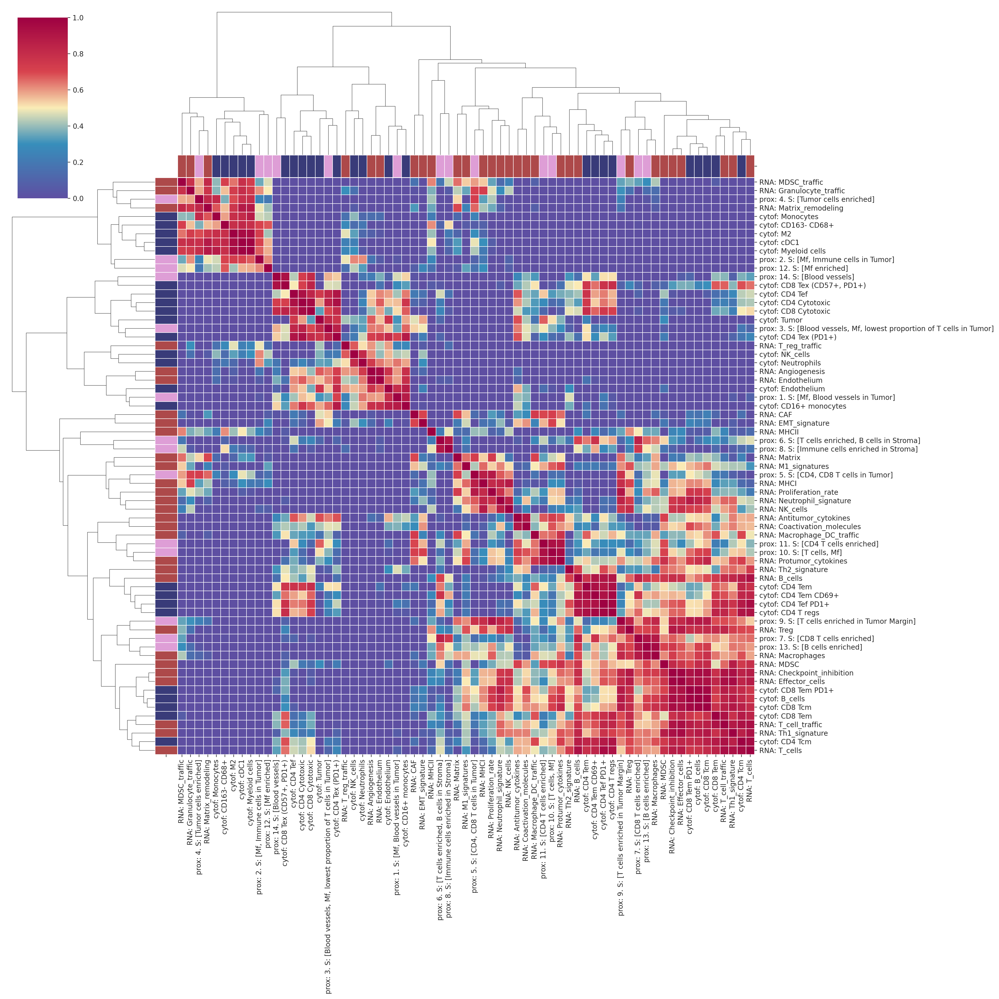

In [132]:
comb_clusters_norm = pd.concat([
    mxif_prox.T.div(mxif_prox.T.sum()), 
    cytof_pivot_tmp.T.div(cytof_pivot_tmp.T.sum()),
    processes.T]).T.dropna(how='any')
print(comb_clusters_norm.shape)

comb_clusters_norm.columns = ['prox: '+x if x in mxif_prox.columns else x for x in comb_clusters_norm.columns]
comb_clusters_norm.columns = ['cytof: '+x if x in cytof_subpop_hierarchy.Second_level_label_with_T.values \
                              else x for x in comb_clusters_norm.columns]
comb_clusters_norm.columns = ['RNA: '+x if x in processes.columns else x for x in comb_clusters_norm.columns]


cluster_ann = pd.Series([x.split(':')[0] for x in comb_clusters_norm.columns], 
                        index=comb_clusters_norm.columns)

comb_clusters_norm_tmp = comb_clusters_norm[cluster_ann[cluster_ann.isin(['prox', 'cytof', 'RNA'])].index]

g = sns.clustermap(comb_clusters_norm_tmp.corr(), 
    cmap=cmap_tmp, figsize=(20, 20),
    col_colors=cluster_ann.map(cluster_ann_pal), row_colors=cluster_ann.map(cluster_ann_pal),
    linewidths=.003, linecolor='white', vmin=0)

In [133]:
cytokines = ['CD274', 'PDCD1', 'CCL11', 'AGER', 'CCL17', 'CSF2', 'CCR4', 'FCER1A', 'TGFBR1', 
             'CXCL13', 'TGFB2', 'S1PR1', 'CCL24', 'ITGAM', 'IL4', 'CCL3', 'CSF3', 'CXCR5', 
             'CCL26', 'SEMA3A', 'IL3RA', 'IL16', 'CX3CR1', 'LTB4R2', 'SELE', 'IL12A', 'PDGFRB', 
             'ITGA9', 'CXCL9', 'PECAM1', 'CCL28', 'CX3CL1', 'PDGFRA', 'XCR1', 'IL15', 'CXCL16', 
             'CCL4', 'IL5', 'EMCN', 'CXCL12', 'CCR8', 'CCL21', 'LTB4R', 'CCL13', 'VEGFA', 'VCAM1', 
             'SELP', 'CXCR6', 'CXCL11', 'PLAU', 'IFNG', 'ITGAL', 'CCL25', 'TGFBR2', 'CCR1', 'MIF', 
             'CSF1', 'XCL1', 'PDGFD', 'CSF1R', 'IL15RA', 'CXCR1', 'JAM3', 'CCL5', 'TNF', 'CXCR2', 
             'IL13', 'IL10', 'PTGDR2', 'CXCL14', 'PDGFA', 'CCL7', 'ITGB2', 'PLAUR', 'CCL22', 'PODXL', 
             'CXCL5', 'SELL', 'CXCL10', 'IL6', 'CCL20', 'CCL19', 'KITLG', 'TNFSF13B', 'CCR7', 'CCL16', 
             'IL12B', 'CXCL1', 'IL3', 'NRP1', 'CXCL8', 'BST1', 'ITGB1', 'TGFB3', 'CMKLR1', 'TGFB1', 
             'RARRES2', 'CXCR3', 'CD34', 'PDGFC', 'CCL8', 'CXCR4', 'IL6R', 'XCL2', 'KIT', 'CCR2', 
             'IL17D', 'CCR10', 'IL2', 'CCR6', 'CCR5', 'CXCL2', 'AOC3', 'HRH4', 'CCL1', 'HMGB1', 'CCR3', 
             'CCL2', 'ICAM1', 'IL5RA', 'FLT1']

cytokines = list(set(cytokines))
len(cytokines)

121

In [134]:
expr_tmp = multireg_expr.loc[cytokines]

expr_tmp = expr_tmp.loc[((expr_tmp.max(axis=1) - expr_tmp.min(axis=1)) > 2)[lambda x: x].index]
expr_tmp.shape

(85, 8)

In [135]:
sel_cytokines = ['PDGFRB', 'CXCL10', 'TNF', 'IL17D',
       'CSF3', 'VEGFA', 'CCL21', 'TNFSF13B', 'CXCL12', 'CCL13',
       'CCL28', 'IFNG', 
       'PECAM1', 'XCL2',  'IL6', 'CXCL2', 'PDCD1',
       'CXCL8', 'EMCN', 'TGFB1', 'CX3CL1',
       'CXCL5', 'CCL2', 'SEMA3A', 'CCL3', 'CCL8',
       'CXCL9', 'CCL5', 'IL15', 'CCL19', 
       'ITGA9', 'CCL4', 
       'CXCL1', 'CXCL14', 'CXCL11', 'PDGFA', 'VCAM1', 'CD274', 'TGFB3',
       'CXCL13', 'CCL20', 'PDGFD', 'IL10', 'PDGFC', 'PLAU']
# selected by expr (max - min) > 2

expr_tmp = expr_tmp.loc[sel_cytokines]

(8, 59)


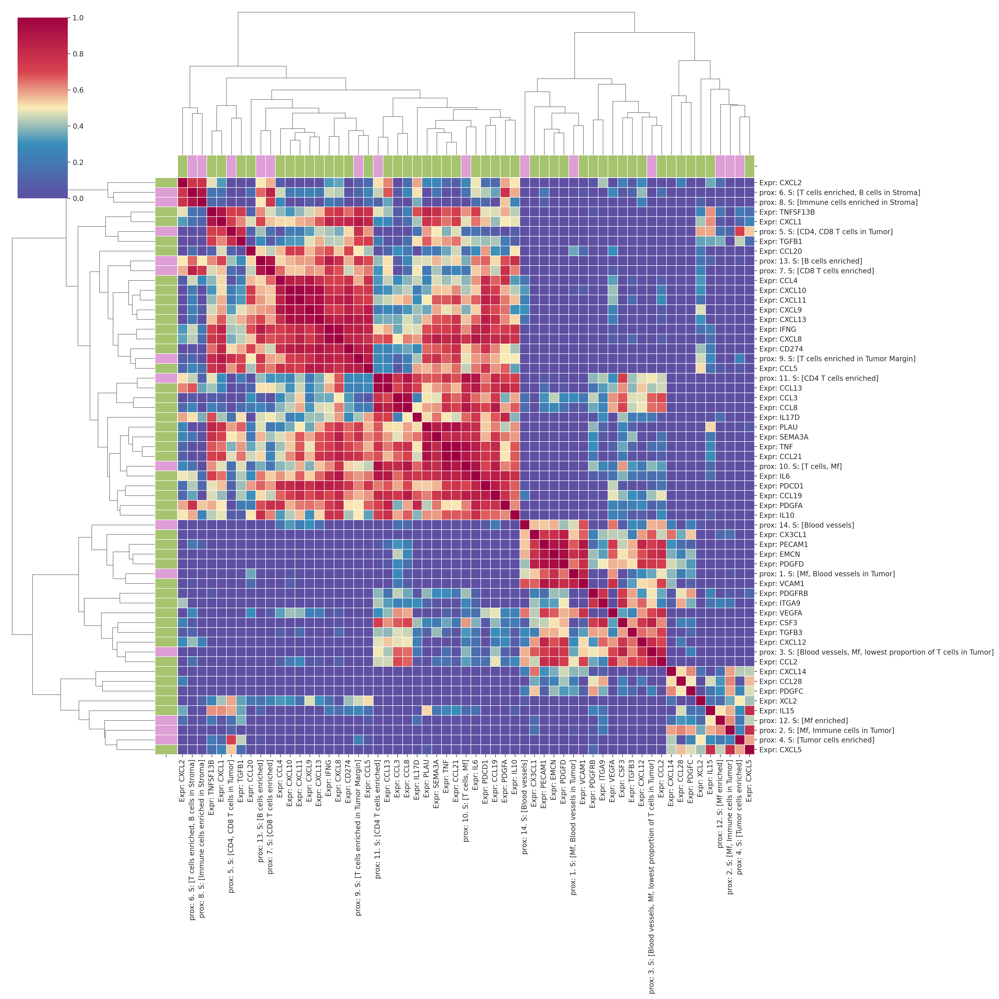

In [136]:
comb_clusters_norm = pd.concat([
    mxif_prox.T.div(mxif_prox.T.sum()), 
    expr_tmp]).T.dropna(how='any')
print(comb_clusters_norm.shape)

comb_clusters_norm.columns = ['prox: '+x if x in mxif_prox.columns else x for x in comb_clusters_norm.columns]
comb_clusters_norm.columns = ['Expr: '+x if x in expr_tmp.index else x for x in comb_clusters_norm.columns]

cluster_ann = pd.Series([x.split(':')[0] for x in comb_clusters_norm.columns], index=comb_clusters_norm.columns)

g = sns.clustermap(comb_clusters_norm.corr(), 
    cmap=cmap_tmp, figsize=(20, 20),
    col_colors=cluster_ann.map(cluster_ann_pal), row_colors=cluster_ann.map(cluster_ann_pal),
    linewidths=.003, linecolor='white', vmin=0)

In [137]:
cytokine_groups = {
    'group 1': GeneSet('group 1', 'descr', ['CCL20', 'CCL4', 'CXCL10', 'CXCL11', 'CXCL9', 'CXCL13']),
    'group 2': GeneSet('group 2', 'descr', 
               ['PLAU', 'SEMA3A', 'TNF', 'CCL21', 'TNFSF13B', 'CXCL1', 'IFNG', 'CXCL8', 'CD274', 'CCL5',]),
    'group 3': GeneSet('group 3', 'descr', ['CCL3', 'CCL8', 'PDCD1', 'CCL19', 'PDGFA', 'IL10', 'IL17D', 'CCL13', 'IL6']),
    'group 4': GeneSet('group 4', 'descr', ['CXCL5', 'CXCL14', 'CCL28', 'PDGFC',]),
    'group 5': GeneSet('group 5', 'descr', ['VEGFA', 'VCAM1', 'CX3CL1', 'PECAM1', 'EMCN', 'PDGFD',]),
    'group 6': GeneSet('group 6', 'descr', ['PDGFRB', 'ITGA9', 'CSF3', 'TGFB3', 'CXCL12', 'CCL2']),
    
    'group 1+2': GeneSet('group 1+2', 'descr', ['CCL20', 'CCL4', 'CXCL10', 'CXCL11', 'CXCL9', 'CXCL13',
                   'PLAU', 'SEMA3A', 'TNF', 'CCL21', 'TNFSF13B', 'CXCL1', 'IFNG', 'CXCL8', 'CD274', 'CCL5']),
    'group 1+2+3': GeneSet('group 1+2', 'descr', ['CCL20', 'CCL4', 'CXCL10', 'CXCL11', 'CXCL9', 'CXCL13',
                   'PLAU', 'SEMA3A', 'TNF', 'CCL21', 'TNFSF13B', 'CXCL1', 'IFNG', 'CXCL8', 'CD274', 'CCL5',
                    'CCL3', 'CCL8', 'PDCD1', 'CCL19', 'PDGFA', 'IL10', 'IL17D', 'CCL13', 'IL6']),
    'group 5+6': GeneSet('group 5+6', 'descr', ['VEGFA', 'VCAM1', 'CX3CL1', 'PECAM1', 'EMCN', 'PDGFD',
                        'PDGFRB', 'ITGA9', 'CSF3', 'TGFB3', 'CXCL12', 'CCL2'])
}


(8, 59)


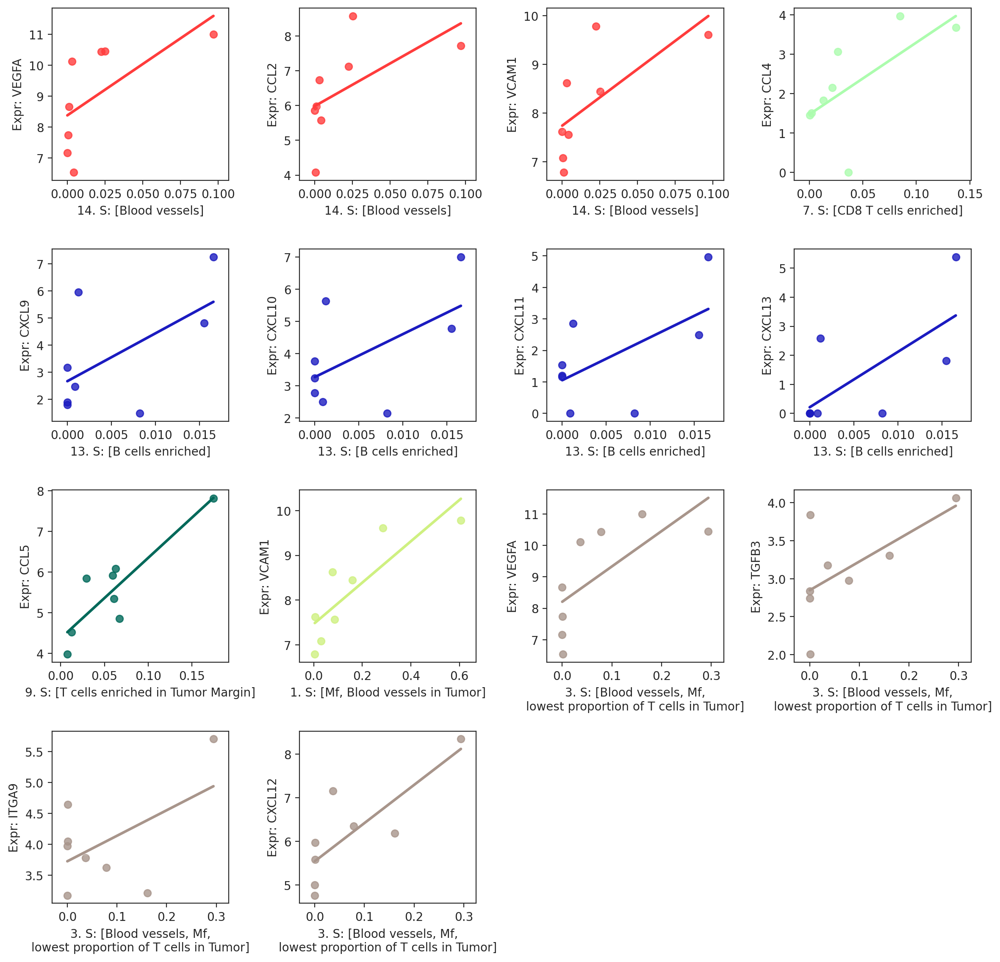

In [138]:
comb_clusters_norm = pd.concat([ 
    mxif_prox.T.div(mxif_prox.T.sum()), 
    expr_tmp]).T.dropna(how='any')
print(comb_clusters_norm.shape)

comb_clusters_norm.columns = ['prox: '+x if x in mxif_prox.columns else x for x in comb_clusters_norm.columns]
comb_clusters_norm.columns = ['Expr: '+x if x in expr_tmp.index else x for x in comb_clusters_norm.columns]
cluster_ann = pd.Series([x.split(':')[0] for x in comb_clusters_norm.columns], index=comb_clusters_norm.columns)



af = axis_net(4, 4, x_len=3.5, y_len=3.5)


for g, selected_comm in zip(
        ['Expr: VEGFA', 'Expr: CCL2', 'Expr: VCAM1', 
    'Expr: CCL4','Expr: CXCL9','Expr: CXCL10','Expr: CXCL11','Expr: CXCL13',
    'Expr: CCL5',
    'Expr: VCAM1', 'Expr: VEGFA', 'Expr: TGFB3', 'Expr: ITGA9', 'Expr: CXCL12'],

    ['prox: 14. S: [Blood vessels]', 'prox: 14. S: [Blood vessels]', 'prox: 14. S: [Blood vessels]',
    'prox: 7. S: [CD8 T cells enriched]','prox: 13. S: [B cells enriched]','prox: 13. S: [B cells enriched]','prox: 13. S: [B cells enriched]','prox: 13. S: [B cells enriched]',
    'prox: 9. S: [T cells enriched in Tumor Margin]',
    'prox: 1. S: [Mf, Blood vessels in Tumor]','prox: 3. S: [Blood vessels, Mf, lowest proportion of T cells in Tumor]','prox: 3. S: [Blood vessels, Mf, lowest proportion of T cells in Tumor]','prox: 3. S: [Blood vessels, Mf, lowest proportion of T cells in Tumor]','prox: 3. S: [Blood vessels, Mf, lowest proportion of T cells in Tumor]','prox: 3. S: [Blood vessels, Mf, lowest proportion of T cells in Tumor]',
    ]):

        ax = sns.regplot(comb_clusters_norm[selected_comm].rename(selected_comm[6:].replace('Mf, lowest', 'Mf,\nlowest')), 
                     comb_clusters_norm[g], ax=next(af), ci=0, color=prox_comm_pallette[selected_comm])
        off = (ax.get_xlim()[1]-ax.get_xlim()[0])*0.05
        ax.set_xlim(ax.get_xlim()[0]-off, ax.get_xlim()[1]+off)

        
ax = next(af)
ax.set_visible(False)
ax = next(af)
ax.set_visible(False)

plt.subplots_adjust(hspace=.4, wspace=.4)

(8, 59)


  0%|          | 0/14 [00:00<?, ?it/s]

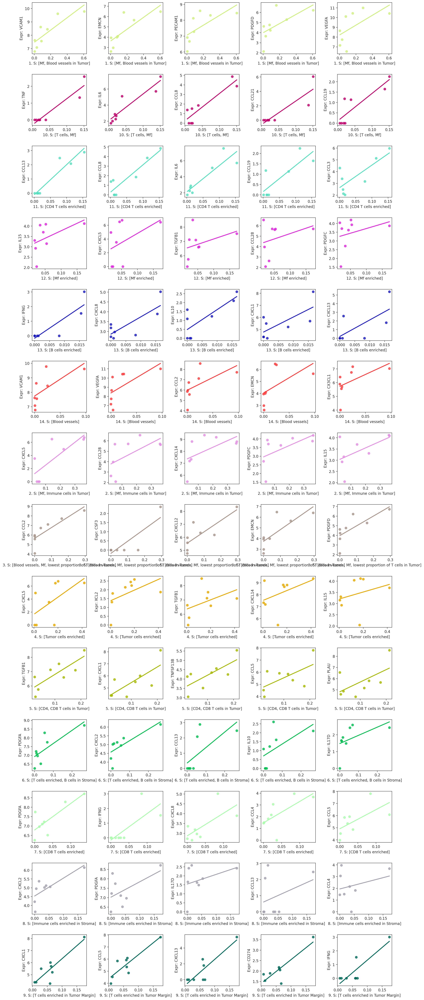

In [139]:
comb_clusters_norm = pd.concat([
    mxif_prox.T.div(mxif_prox.T.sum()), 
    expr_tmp]).T.dropna(how='any')
print(comb_clusters_norm.shape)

comb_clusters_norm.columns = ['prox: '+x if x in mxif_prox.columns else x for x in comb_clusters_norm.columns]
comb_clusters_norm.columns = ['Expr: '+x if x in expr_tmp.index else x for x in comb_clusters_norm.columns]
cluster_ann = pd.Series([x.split(':')[0] for x in comb_clusters_norm.columns], index=comb_clusters_norm.columns)


af = axis_net(5, 14, x_len=3.5, y_len=3.5)

for selected_comm in tqdm_notebook(sorted(comb_clusters_norm.columns[:14])):

    selected_cyto = comb_clusters_norm.corr().loc[
        cluster_ann[cluster_ann == 'Expr'].index, selected_comm].sort_values()[-5:].index[::-1]

    for g in selected_cyto:
        sns.regplot(comb_clusters_norm[selected_comm].rename(selected_comm[6:]), comb_clusters_norm[g], 
                ax=next(af), color=prox_comm_pallette[selected_comm], ci=0)
        
plt.subplots_adjust(hspace=.4, wspace=.4)

(8, 59)


  0%|          | 0/14 [00:00<?, ?it/s]

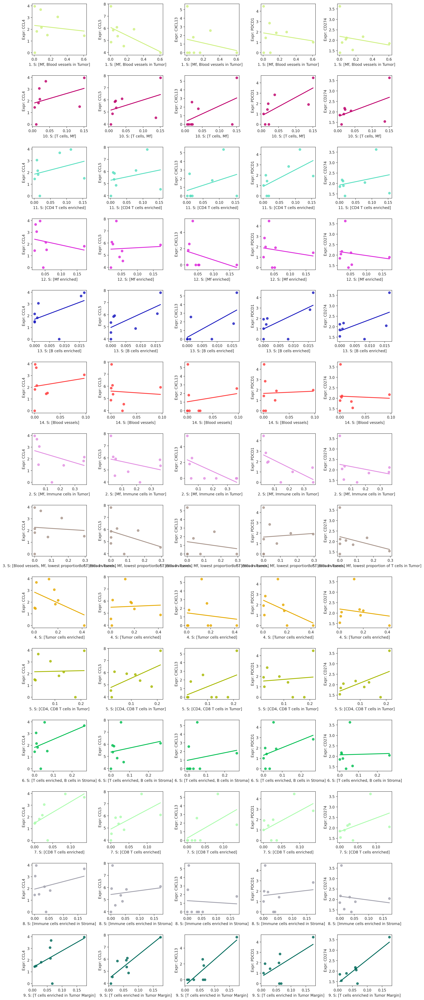

In [140]:
comb_clusters_norm = pd.concat([
    mxif_prox.T.div(mxif_prox.T.sum()), 
    expr_tmp]).T.dropna(how='any')
print(comb_clusters_norm.shape)

comb_clusters_norm.columns = ['prox: '+x if x in mxif_prox.columns else x for x in comb_clusters_norm.columns]
comb_clusters_norm.columns = ['Expr: '+x if x in expr_tmp.index else x for x in comb_clusters_norm.columns]
cluster_ann = pd.Series([x.split(':')[0] for x in comb_clusters_norm.columns], index=comb_clusters_norm.columns)



af = axis_net(5, 14, x_len=3.5, y_len=3.5)

for selected_comm in tqdm_notebook(sorted(comb_clusters_norm.columns[:14])):

    for g in ['CCL4', 'CCL5', 'CXCL13', 'PDCD1', 'CD274']:
        sns.regplot(comb_clusters_norm[selected_comm].rename(selected_comm[6:]), 
                    comb_clusters_norm['Expr: '+g], ax=next(af), ci=0, color=prox_comm_pallette[selected_comm])
        
plt.subplots_adjust(hspace=.4, wspace=.4)

(8, 59)


  0%|          | 0/14 [00:00<?, ?it/s]

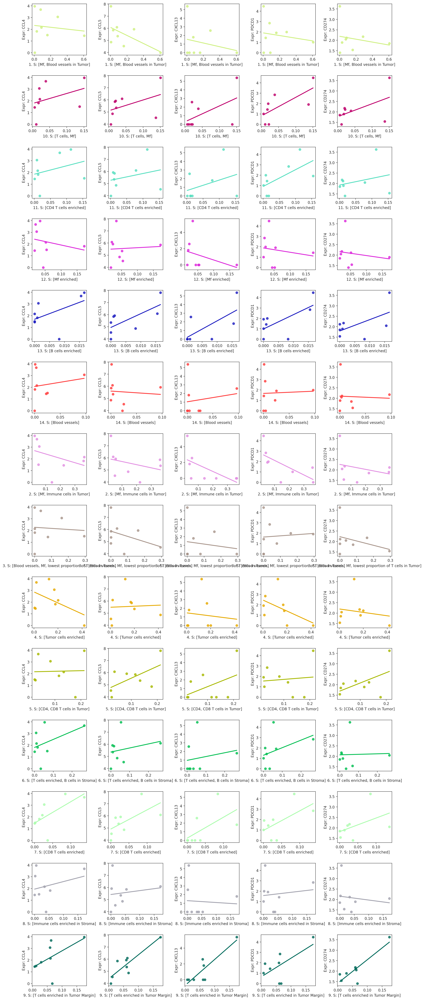

In [141]:
comb_clusters_norm = pd.concat([ 
    mxif_prox.T.div(mxif_prox.T.sum()), 
    expr_tmp]).T.dropna(how='any')
print(comb_clusters_norm.shape)

comb_clusters_norm.columns = ['prox: '+x if x in mxif_prox.columns else x for x in comb_clusters_norm.columns]
comb_clusters_norm.columns = ['Expr: '+x if x in expr_tmp.index else x for x in comb_clusters_norm.columns]
cluster_ann = pd.Series([x.split(':')[0] for x in comb_clusters_norm.columns], index=comb_clusters_norm.columns)



af = axis_net(5, 14, x_len=3.5, y_len=3.5)

for selected_comm in tqdm_notebook(sorted(comb_clusters_norm.columns[:14])):

    for g in ['CCL4', 'CCL5', 'CXCL13', 'PDCD1', 'CD274']:
        sns.regplot(comb_clusters_norm[selected_comm].rename(selected_comm[6:]), 
                    comb_clusters_norm['Expr: '+g], ax=next(af), ci=0, 
                    color=prox_comm_pallette[selected_comm])
        
plt.subplots_adjust(hspace=.4, wspace=.4)

# MxIF

In [142]:
megadf = read_dataset('./data/mxif/cells_mxif.csv.gz', sep=',', index_col=None)
megadf.shape

(856665, 12)

In [143]:
megadf['sample_id'] = megadf.sample_id.apply(lambda x: x.replace('_', '-')[3:])

megadf['patient'] = megadf['sample_id']

megadf['cell_id'] = megadf.patient + '_' + megadf.image_roi.apply(str) + \
    '_' + megadf.center_x.apply(str)

megadf.shape

(856665, 14)

In [144]:
megadf['patient_full'] = megadf.patient.apply(lambda x: x[:3])

In [145]:
roi_ann_df = read_dataset('./data/mxif/pathological_annotation_full.csv', sep=',')

In [146]:
megadf['roi_ann'] = np.nan

megadf['roi_ann'] = 'tumor'

In [147]:
megadf.image_roi = megadf.image_roi.apply(lambda x: str(int(x)) if '_' not in str(x) else x)

In [148]:
for pat in sorted(set(megadf.patient)):

    megadf.loc[megadf[megadf.patient == pat].index, 'roi_ann'] = \
        megadf[megadf.patient == pat].image_roi.map(
            roi_ann_df[roi_ann_df.patient==pat].set_index('image_roi').region_type.replace(np.nan, 'nan').to_dict())

In [149]:
megadf['cell_id'] = megadf.sample_id + '--' + megadf.image_roi + '--' + \
    megadf['index'].apply(lambda x: str(x))

Adding T cell subtypes

In [150]:
t_subtypes_dict = {
    
     '107-A2': {'CD8': [2, 3], 'CD4': [2, 4]},
     '107-A3': {'CD8': [2, 3], 'CD4': [2, 4]},
    
     '117-A1': {'CD8': [2, 3.5], 'CD4': [2, 4]},
     '117-A2': {'CD8': [2, 3.5], 'CD4': [2, 4]},
     '117-A3': {'CD8': [2, 3], 'CD4': [2, 4]},
    
     '120-A1': {'CD8': [1.7, 1.7], 'CD4': [2, 4]},
     '120-A2': {'CD8': [2.3, 2.3], 'CD4': [2, 4]},
     '120-A3': {'CD8': [2, 3], 'CD4': [2, 4]},
     '124-A1': {'CD8': [2, 3], 'CD4': [2, 4]},
     '124-A2': {'CD8': [2, 3], 'CD4': [2, 4]},

}

In [151]:
megadf['cell_subtype'] = 'undefined'
cell_subtypes = pd.Series(index=megadf.index)

for pat in sorted(t_subtypes_dict.keys()):
    
    ind = megadf[megadf.patient == pat].index

    log_cd4 = np.log10(megadf.CD4_mean_intensity[ind] + 1)
    log_cd8 = np.log10(megadf.CD8_mean_intensity[ind] + 1)
    

    v1 = [t_subtypes_dict[pat]['CD8'][1]-t_subtypes_dict[pat]['CD8'][0],
         t_subtypes_dict[pat]['CD4'][1]-t_subtypes_dict[pat]['CD4'][0]]

    v2 = [t_subtypes_dict[pat]['CD8'][1]-log_cd8,
         t_subtypes_dict[pat]['CD4'][1]-log_cd4]

    xp = v1[0]*v2[1] - v1[1]*v2[0]
    
    megadf.loc[xp[xp >= 0].index, 'cell_subtype'] = 'CD8'
    megadf.loc[xp[xp < 0].index, 'cell_subtype'] = 'CD4'

megadf.loc[megadf[megadf.cell_type != 't_cells'].index, 'cell_subtype'] = 'undefined'

In [152]:
for pat, thr in zip(['117-A1', '117-A2', '117-A3', '120-A1'], [2.5, 3, 3, 2.1]):

    megadf.loc[
        megadf[(megadf.patient == pat) & (megadf.cell_subtype == 'CD4') & \
              (np.log10(1+megadf.KI67_mean_intensity) > thr)].index, 'cell_subtype'] = 'CD4_KI67+'
    
    megadf.loc[
        megadf[(megadf.patient == pat) & (megadf.cell_subtype == 'CD8') & \
              (np.log10(1+megadf.KI67_mean_intensity) > thr)].index, 'cell_subtype'] = 'CD8_KI67+'

In [153]:
for pat, thr in zip(['117-A2', '120-A1', '120-A2'], [2.9, 2.8, 3]):

    megadf.loc[
        megadf[(megadf.patient == pat) & (megadf.cell_type == 't_cells') & \
              (np.log10(1+megadf.GRB_mean_intensity) > thr)].index, 'cell_subtype'] = 'CD8_GRB+'

In [154]:
pivot_vectors(megadf[(megadf.patient == '117-A3') & (megadf.cell_type == 't_cells')].cell_type,
              megadf[(megadf.patient == '117-A3') & (megadf.cell_type == 't_cells')].cell_subtype)

cell_type,t_cells
cell_subtype,
CD4,11982
CD4_KI67+,2928
CD8,12400
CD8_KI67+,3094


In [155]:
megadf['cell_subtype_merged'] = megadf['cell_subtype'].replace({
    'CD8_KI67+': 'CD8', 'CD4_KI67+': 'CD4', 'CD8_GRB+': 'CD8'
})

megadf.loc[megadf[megadf['cell_subtype_merged'] == 'undefined'].index, 'cell_subtype_merged'] = \
    megadf.loc[megadf[megadf['cell_subtype_merged'] == 'undefined'].index, 'cell_type']

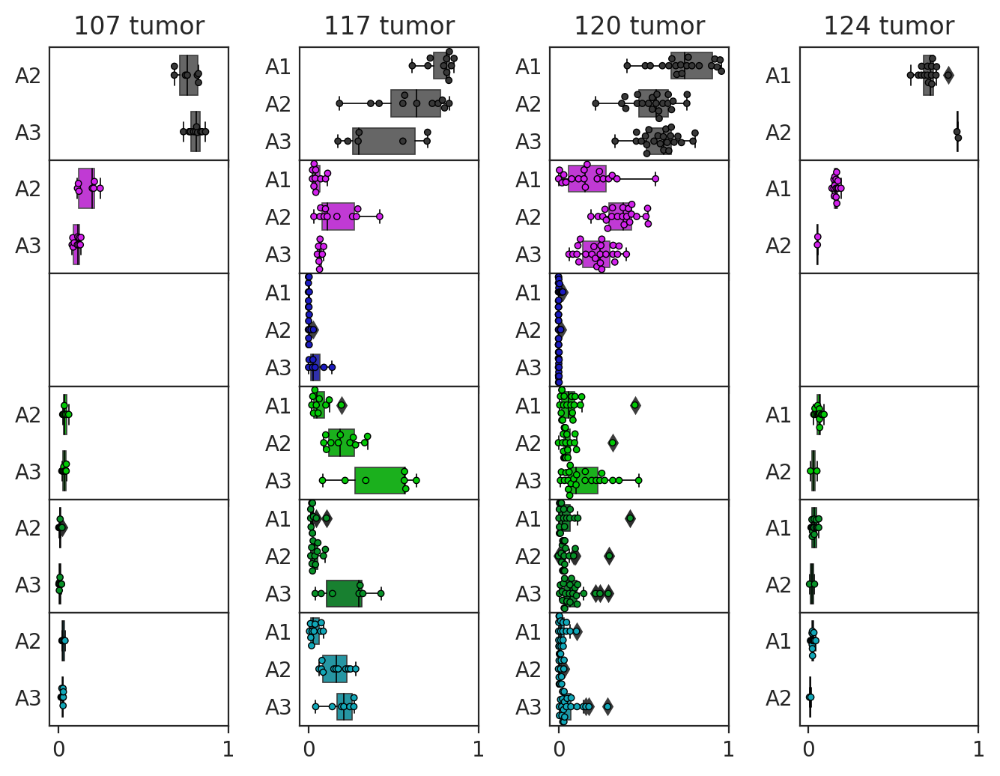

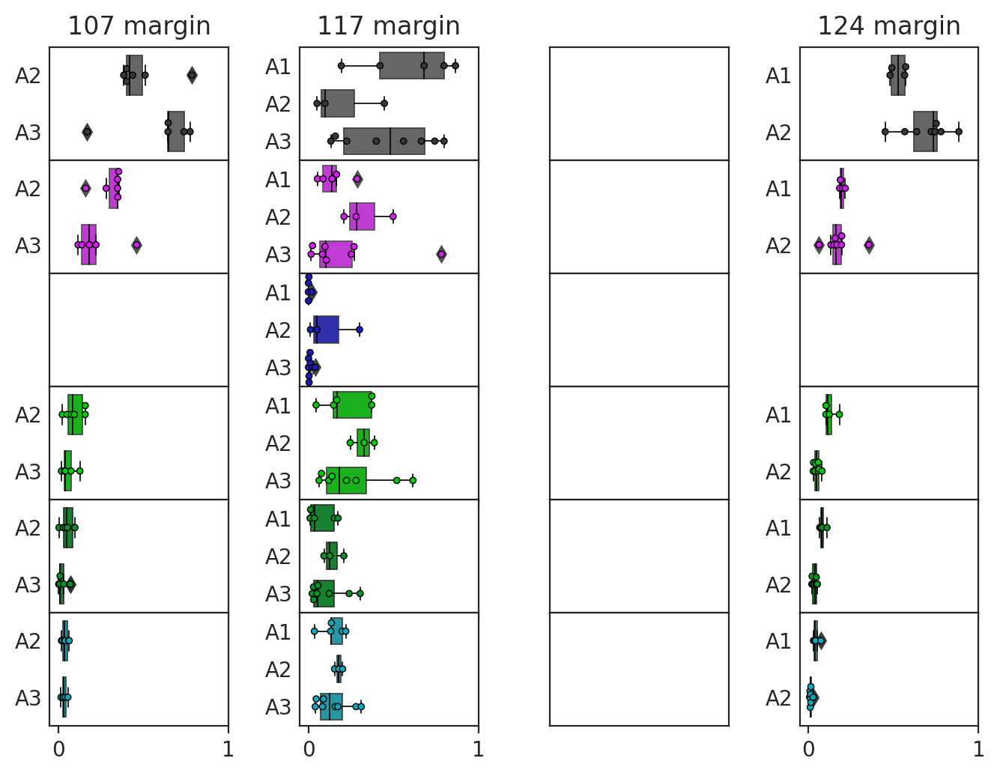

In [156]:
sns.set_style('ticks')
cells = ['tumor', 'macro', 'b_cells', 't_cells', 'CD4', 'CD8']

        
for place in ['tumor', 'margin']:
    af = axis_net(4, 6, y_len=1, x_len=2, title='')    

    for cell_tmp in ['tumor', 'macro', 'b_cells', 't_cells', 'CD4', 'CD8']:

        for pat_full in ['107', '117', '120', '124']:
            
            pats = sorted(set(megadf[megadf.patient_full == pat_full].patient))

            ax = next(af)

            if 'CD' in cell_tmp:
                megadf_tmp = megadf[(megadf.patient_full == pat_full) & (megadf.cell_subtype_merged == cell_tmp) & \
                                    (megadf.roi_ann == place)]
                pal_tmp = t_cells_p

            else:
                megadf_tmp = megadf[(megadf.patient_full == pat_full) & (megadf.cell_type == cell_tmp) & \
                                    (megadf.roi_ann == place)]
                pal_tmp = cell_p_mxif2

            if megadf_tmp.shape[0] == 0:
                ax.set_xticklabels('')
                ax.set_yticklabels('')
                ax.tick_params(length=0)

                continue

            tmp = pivot_vectors(megadf_tmp.image_roi.rename(''), megadf_tmp.patient)


            tmp_full = pivot_vectors(
                megadf[(megadf.patient_full == pat_full) & (megadf.roi_ann == place) & \
                       (~megadf.cell_type.isin(['endothelium', 'undefined']))].image_roi,
                megadf[(megadf.patient_full == pat_full) & (megadf.roi_ann == place) & \
                       (~megadf.cell_type.isin(['endothelium', 'undefined']))].patient)

            tmp_full = tmp_full[tmp_full > 500].replace(np.nan, 0)
            tmp = tmp.div(tmp_full)
            
            if cell_tmp == 'tumor':
                color = '#666666'
            else:
                color = pal_tmp[cell_tmp]

            ax = sns.boxplot(tmp.T.melt().value, tmp.T.melt().patient, order=pats, linewidth=.6,
                             color=color, width=.7, ax=ax)

            ax = sns.swarmplot(tmp.T.melt().value, tmp.T.melt().patient, linewidth=.5,
                               edgecolor='black',ax=ax, order=pats, color=pal_tmp[cell_tmp], s=3)
            plt.setp(ax.artists, edgecolor = 'k')
            plt.setp(ax.lines, color='k')
            ax.set_ylabel('')
            ax.set_xlim(-.05, 1)

            ax.set_yticklabels([x[4:] for x in pats])

            if cell_tmp == cells[0]:
                ax.set_title(pat_full+' '+place)

            ax.set_xlabel('')
            ax.tick_params(axis='y', length=0)

            if cell_tmp != cells[-1]:
                ax.set_xticklabels('')

    plt.subplots_adjust(wspace=.4, hspace=.0)

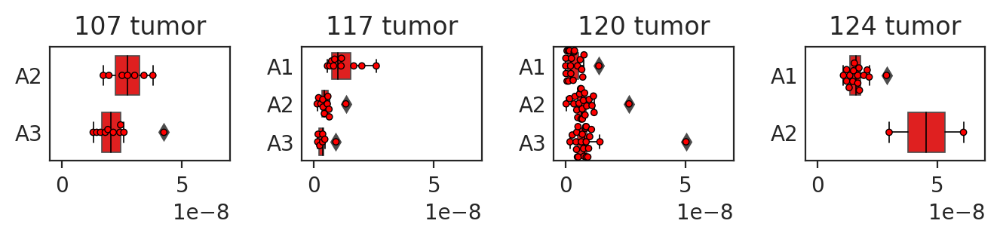

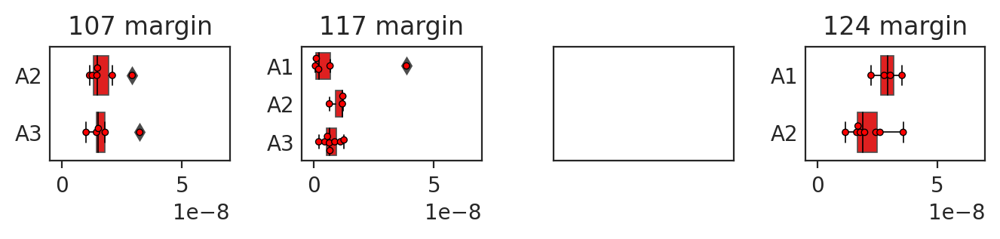

In [157]:
for place in ['tumor', 'margin']:
    
    af = axis_net(4, 1, y_len=1, x_len=2, title='')
    
    for pat_full in ['107', '117', '120', '124']:

        pats = sorted(set(megadf[megadf.patient_full == pat_full].patient))
        ax = next(af)   
        pal_tmp = {'endo': 'red'}
        
        tmp = roi_ann_df[(roi_ann_df.region_type == place) & (roi_ann_df.patient.isin(pats))].pivot_table(
            index='patient',columns='image_roi', values='stroma_mask')
        tmp = tmp.replace(np.inf, np.nan)
        
        if tmp.shape[0] == 0:
            ax.set_xticklabels('')
            ax.set_yticklabels('')
            ax.tick_params(length=0)
            continue
        
        tmp = tmp.div(megadf[megadf.sample_id.isin(pats)].pivot_table(
            index='sample_id', columns='image_roi', values='area', aggfunc='sum')).dropna(how='all', axis=1)

        ax = sns.boxplot(tmp.T.melt().value, tmp.T.melt().patient, order=pats, linewidth=.6,
                         color=pal_tmp['endo'], width=.7, ax=ax)

        ax = sns.swarmplot(tmp.T.melt().value, tmp.T.melt().patient, linewidth=.5,
                           edgecolor='black',ax=ax, order=pats, color=pal_tmp['endo'], s=3)
        plt.setp(ax.artists, edgecolor = 'k')
        plt.setp(ax.lines, color='k')
        ax.set_ylabel('')
        ax.set_xlim(-.5e-8, 7e-8)

        ax.set_yticklabels([x[4:] for x in pats])

        ax.set_title(pat_full+' '+place)

        ax.set_xlabel('')
        ax.tick_params(axis='y', length=0)
                

    plt.subplots_adjust(wspace=.4, hspace=.0)

In [158]:
fibro_data = read_dataset('./data/mxif/mxif_fibrosis.tsv')['Fibrosis']

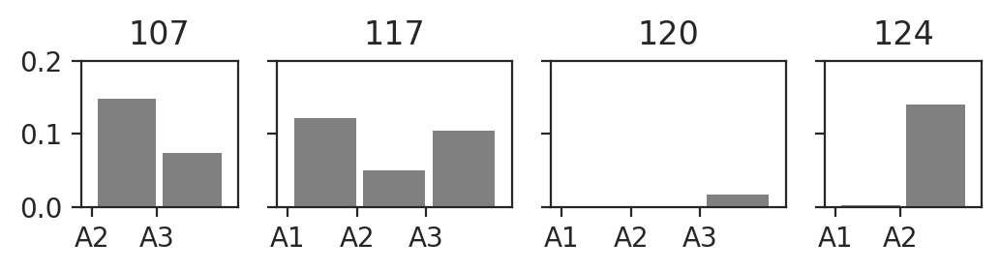

In [159]:
af = axis_net(4, 1, x_len=1.5, y_len=1, gridspec_kw={'width_ratios': [2, 3, 3, 2]},)

for pats in [['107-A2', '107-A3'], ['117-A1', '117-A2', '117-A3',], ['120-A1', '120-A2', '120-A3', ],
             ['124-A1', '124-A2']]:
    
    ax=next(af)    
        
    ax = bot_bar_plot(pd.DataFrame(fibro_data[pats]).fillna(0), 
            palette={'Fibrosis':'grey'}, lrot=90, percent=False, ax=ax, 
            legend=False, plot_all_borders=False)
    
    ax.set_xlabel('')
    ax.set_ylim(0, .2)
    ax.set_title(pats[0][:3])
    ax.set_xticklabels([x[-2:] for x in pats], rotation=0)
    
    if pats[0] != '107-A2':
        ax.set_yticklabels('')

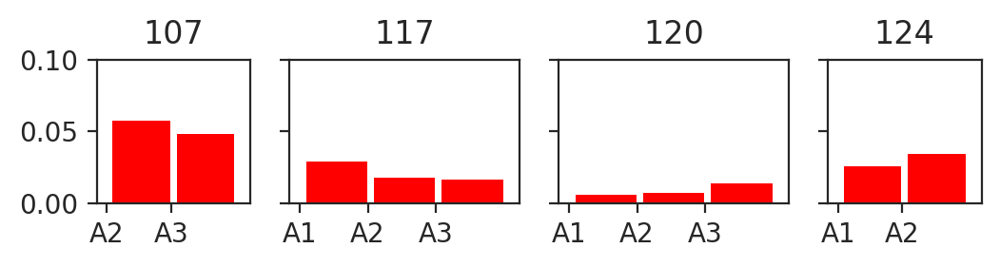

In [160]:
af = axis_net(4, 1, x_len=1.5, y_len=1, gridspec_kw={'width_ratios': [2, 3, 3, 2]})

for pats in [['107-A2', '107-A3'], ['117-A1', '117-A2', '117-A3',], ['120-A1', '120-A2', '120-A3', ],
             ['124-A1', '124-A2']]:
    
    ax= bot_bar_plot(pd.DataFrame(
        roi_ann_df.dropna().groupby(by='patient')['stroma_mask'].mean()).T[pats].T, 
                     
            palette={'stroma_mask':'red'}, lrot=90, percent=False, ax=next(af), 
            legend=False, plot_all_borders=False)
    
    ax.set_xlabel('')
    ax.set_ylim(0, .1)
    ax.set_title(pats[0][:3])
    ax.set_xticklabels([x[-2:] for x in pats], rotation=0)
    
    if pats[0] != '107-A2':
        ax.set_yticklabels('')

In [161]:
def draw_t_markers_clusters(sample, cell_type, marker1, marker2, data=megadf,
                            ax=None, areas=['Tumor', 'Normal'],
                            color_by_cell_subtypes=False, color='blue', 
                            marker1_tr='log10p1', marker2_tr='log10p1',
                            marker1_threshold_upper=None, marker2_threshold_upper=None,
                            subsample=None, size=.5):        
    
    if ax is None:
        ax = axis_net(1, 1)
        
    
    data1 = data[(data.patient == sample) & (data.cell_type == cell_type)
                       ][marker1].dropna() 

    data2 = data[(data.patient == sample) & (data.cell_type == cell_type)
                       ][marker2].dropna()
    
    
    if sample is None:
        data1 = data[(data.cell_type == cell_type)][marker1].dropna()
        data2 = data[(data.cell_type == cell_type)][marker2].dropna()
     
    if marker1_tr == 'log10p1':
        data1 = np.log10(data1 + 1)
    elif marker1_tr == '1/x':
        data1 = 1 / (data1 + 1)
        data1 = data1.rename('1 / ' + data1.name)
        
    if marker2_tr == 'log10p1':
        data2 = np.log10(data2 + 1)
    elif marker2_tr == '1/x':
        data2 = 1 / (data2 + 1)          
        data2 = data2.rename('1 / ' + data2.name)

    ind = data1.index & data2.index
    
    if len(ind) < 10:
        return None
    
    if subsample is not None:
        ind = data2.loc[ind].sample(n=min(subsample, len(ind))).index
    print(len(ind))
    
    data1 = data1.loc[ind]
    data2 = data2.loc[ind] 
    
    
    if not color_by_cell_subtypes:
        simple_scatter(data1, data2, ax=ax, s=size, alpha=.8, color=color)
        
    else:
        for cell_subt in sorted(set(data.loc[data1.index, 'cell_subtype'])):
            
            common_ind = data[data.cell_subtype == cell_subt].index & ind
            
            simple_scatter(data1.loc[common_ind], data2.loc[common_ind], 
                           ax=ax, s=size, alpha=.8, color=t_cells_p[cell_subt])
        

    sns.kdeplot(data1, data2, ax=ax, cmap=None, color='black', linewidths=.7)
    
    if (len(areas) == 2) & (sample is not None):
        ax.set_title(sample + ' ' + cell_type )
    elif (len(areas) == 1) & (sample is not None):
        ax.set_title(sample + ' ' + cell_type + ' in ' + areas[0])
    else:
        ax.set_title(cell_type)

    return ax

5000
5000
5000
5000


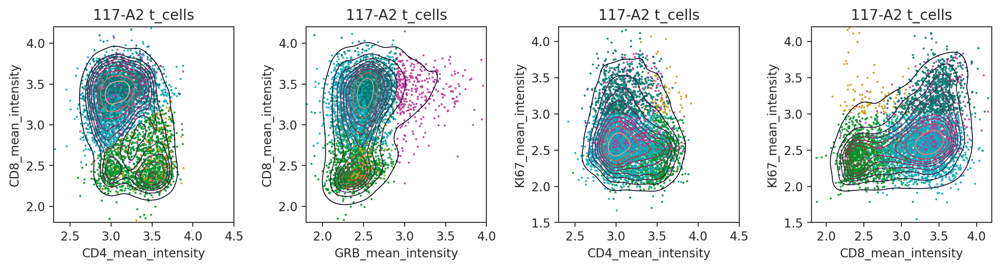

In [162]:
af = axis_net(4, 1, y_len=3, x_len=3.5)

for pat in ['117-A2']:   
    
    for x, y, xlim, ylim in zip(
        ['CD4_mean_intensity', 'GRB_mean_intensity', 'CD4_mean_intensity', 'CD8_mean_intensity'], 
        ['CD8_mean_intensity', 'CD8_mean_intensity', 'KI67_mean_intensity', 'KI67_mean_intensity'],
        [(2.3, 4.5), (1.8, 4), (2.3, 4.5), (1.8, 4.2),],
        [(1.8, 4.2), (1.8, 4.2), (1.5, 4.2), (1.5, 4.2)]):        
        
        ax=next(af)    
        
        draw_t_markers_clusters(pat, cell_type='t_cells', 
            marker1=x, marker2=y, ax=ax, size=.7, subsample=5000, color_by_cell_subtypes=True)

        ax.set_xlim(xlim)
        ax.set_ylim(ylim)
        ax.grid(False)

plt.subplots_adjust(hspace=.4, wspace=.4)

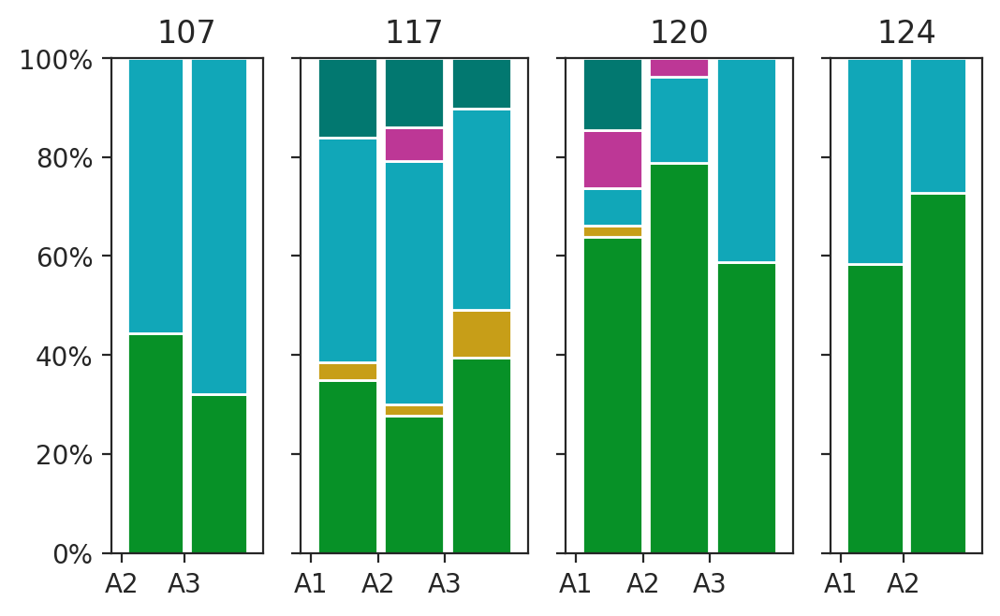

In [163]:
af = axis_net(4, 1, x_len=1.5, y_len=3.5, gridspec_kw={'width_ratios': [2, 3, 3, 2]})

for pats in [['107-A2', '107-A3'], ['117-A1', '117-A2', '117-A3',], ['120-A1', '120-A2', '120-A3', ],
             ['124-A1', '124-A2']]:
    
    ax= bot_bar_plot(pivot_vectors(megadf.patient, megadf.cell_subtype)[pats].T.drop('undefined', axis=1), 
         palette=t_cells_p, lrot=90, percent=True, ax=next(af), legend=False, plot_all_borders=False, linewidth=1)
    ax.set_xlabel('')
    ax.set_title(pats[0][:3])
    ax.set_xticklabels([x[-2:] for x in pats], rotation=0)
    
    if pats[0] != '107-A2':
        ax.set_yticklabels('')

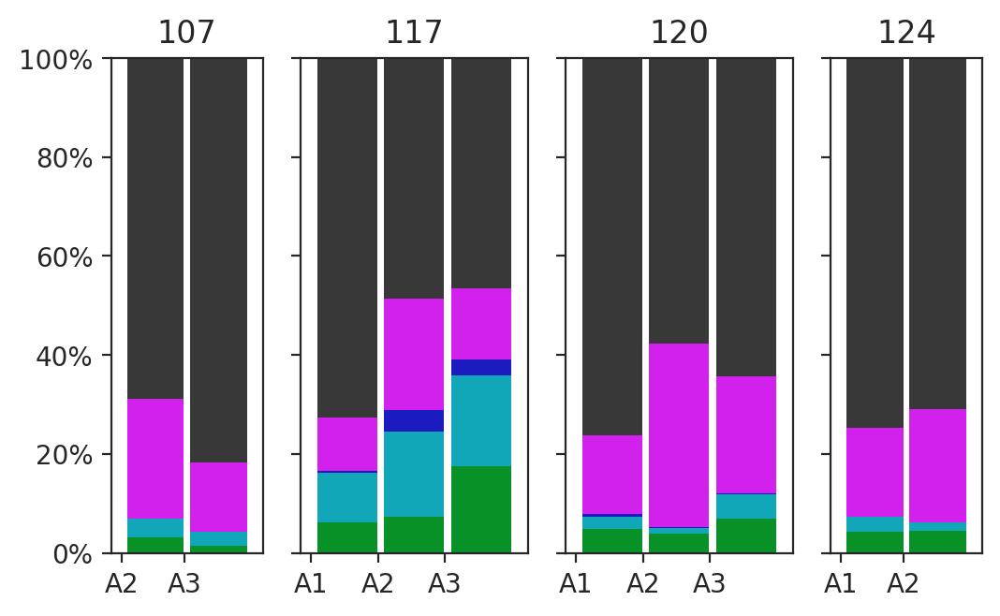

In [164]:
af = axis_net(4, 1, x_len=1.5, y_len=3.5, gridspec_kw={'width_ratios': [2, 3, 3, 2]})

for pats in [['107-A2', '107-A3'], ['117-A1', '117-A2', '117-A3',], ['120-A1', '120-A2', '120-A3', ],
             ['124-A1', '124-A2']]:
    
    ax= bot_bar_plot(pivot_vectors(megadf.patient, megadf.cell_subtype_merged)[pats].T.drop([
            'endothelial_cells', 'undefined'], axis=1).rename({'macrophages': 'macro'}, axis=1), 
             palette=cell_p_mxif3, lrot=90, percent=True, ax=next(af), legend=False, plot_all_borders=False)
    ax.set_xlabel('')
    ax.set_title(pats[0][:3])
    ax.set_xticklabels([x[-2:] for x in pats], rotation=0)
    
    if pats[0] != '107-A2':
        ax.set_yticklabels('')

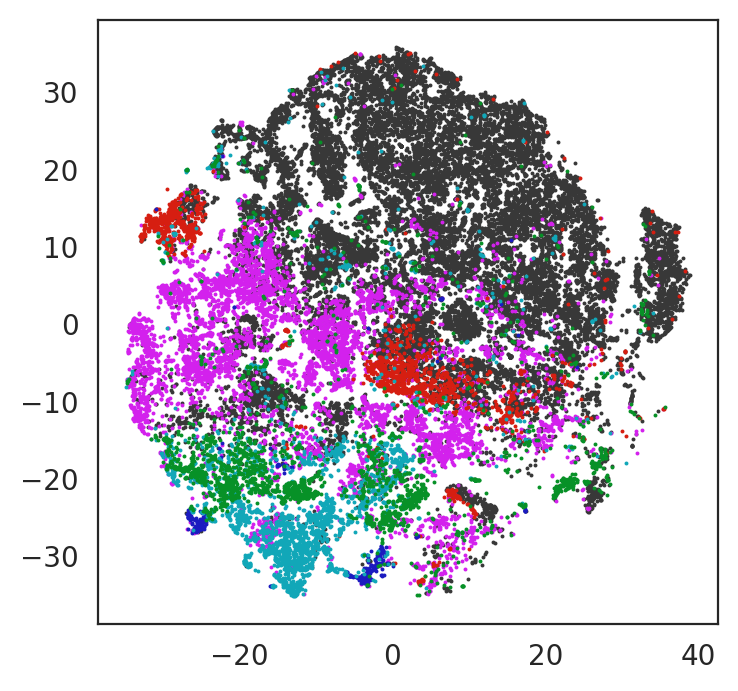

In [47]:
with sns.axes_style('white'):
    af = axis_net(1, 1)

tmp_new = read_dataset('./tsne_frame_multiregional_for_Natasha.csv', sep=',')
tmp_new.exact_cell_type = tmp_new.exact_cell_type.map({
    'tumor': 'tumor', 'macrophages': 'macro', 'undefined': 'undefined', 'CD8': 'CD8', 
    'CD4': 'CD4', 'endothelium': 'endothelial_cells', 'CD8_KI67+': 'CD8', 
    'b_cells': 'b_cells', 'CD4_KI67+': 'CD4', 'CD8_GRB+': 'CD8'})

for cell in sorted(set(tmp_new.exact_cell_type) ^ {'undefined'})[::-1]:

    ax = simple_palette_scatter(tmp_new.v0.rename(''), tmp_new.v1.rename(''), 
            tmp_new[(tmp_new.exact_cell_type == cell)].exact_cell_type, ax=af, 
            palette=cell_p_mxif_tmp, s=2, linewidth=0, legend=False)

    ax.set_title('')

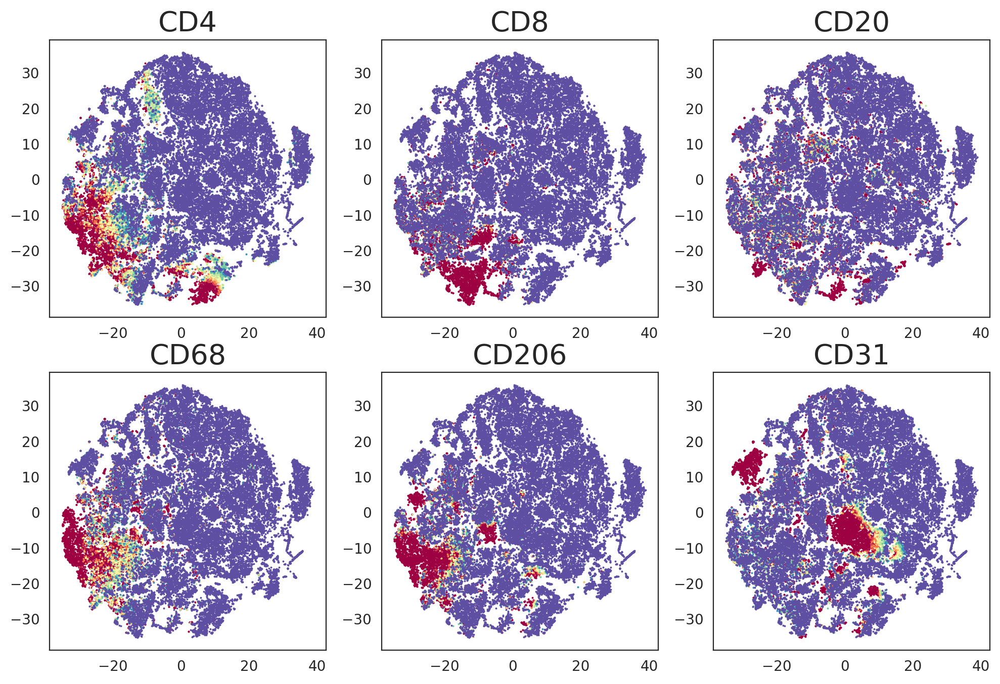

In [48]:
with sns.axes_style('white'):
    af = axis_net(3, 2)

for gene in ['CD4', 'CD8', 'CD20', 'CD68', 'CD206', 'CD31']:
    
    ax = next(af)
    
    quantile_90 = np.quantile(np.arcsinh(.2*tmp_new[gene]).values, .9)

    groups_by_marker = to_linear_ranges(
            -np.arcsinh(.2*tmp_new[gene]).clip(0, quantile_90), ps=np.arange(0, 1, .1))

    ax = simple_palette_scatter(tmp_new.v0.rename(''), tmp_new.v1.rename(''), 
            groups_by_marker.apply(lambda x: float(x.split('p')[0])), 
            palette=cytof_marker_intensity_pal, ax=ax, s=2, linewidth=0, legend=False)
    ax.set_title(gene, size=20)

plt.subplots_adjust(hspace=.2, wspace=.2)